# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 48kB/s  eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

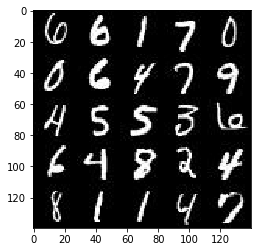

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

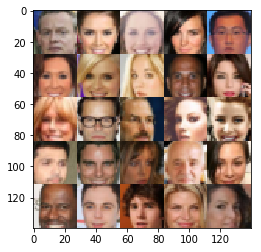

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels),
                                'real_inputs')
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), 'z_inputs')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    with tf.variable_scope('discriminator', reuse=reuse):
        
        alpha = 0.2
        
        h1 = tf.layers.conv2d(images, 64, 5, 2, 'same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        h1 = tf.maximum(alpha * h1, h1)
        
        h2 = tf.layers.conv2d(h1, 128, 5, 2, 'same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        h2 = tf.layers.batch_normalization(h2, training=True)
        h2 = tf.maximum(alpha * h2, h2)
        
        h3 = tf.layers.conv2d(h2, 256, 5, 2, 'same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        h3 = tf.layers.batch_normalization(h3, training=True)
        h3 = tf.maximum(alpha * h3, h3)
        
        flat = tf.reshape(h3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope('generator', reuse=not is_train):
        alpha = 0.2
    
        h1 = tf.layers.dense(z, 2*2*512)
        h1 = tf.reshape(h1, (-1, 2, 2, 512))
        h1 = tf.layers.batch_normalization(h1, training=is_train)
        h1 = tf.maximum(alpha * h1, h1)
    
        h2 = tf.layers.conv2d_transpose(h1, 256, 5, 2, 'valid',kernel_initializer=tf.contrib.layers.xavier_initializer())
        h2 = tf.layers.batch_normalization(h2, training=is_train)
        h2 = tf.maximum(alpha * h2, h2)
    
        h3 = tf.layers.conv2d_transpose(h2, 128, 5, 2, 'same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        h3 = tf.layers.batch_normalization(h3, training=is_train)
        h3 = tf.maximum(alpha * h3, h3)
    
        logits = tf.layers.conv2d_transpose(h3, out_channel_dim, 5, 2, 'same',kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.tanh(logits)
    
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.9))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    d_train_opt = tf.train.AdamOptimizer(
        learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in ops if opt.name.startswith('generator')]
    with tf.control_dependencies(g_updates):
        g_train_opt = tf.train.AdamOptimizer(
            learning_rate, beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, img_width, img_height, img_channels = data_shape
    
    real_input, z_input, lr = model_inputs(
        img_width, img_height, img_channels, z_dim)
    
    d_loss, g_loss = model_loss(real_input, z_input, img_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every = 10
    show_every = 100
    losses = []
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2.0
                z_sample = np.random.uniform(-1, 1, (batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={
                        real_input: batch_images, z_input: z_sample, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={
                        z_input: z_sample, lr: learning_rate})
                
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({z_input: z_sample, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: z_sample})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, z_input, img_channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.3393... Generator Loss: 2.7444
Epoch 1/2... Discriminator Loss: 1.8021... Generator Loss: 5.7551
Epoch 1/2... Discriminator Loss: 1.8385... Generator Loss: 3.0000
Epoch 1/2... Discriminator Loss: 0.6541... Generator Loss: 1.8856
Epoch 1/2... Discriminator Loss: 1.3278... Generator Loss: 4.6558
Epoch 1/2... Discriminator Loss: 1.5202... Generator Loss: 0.3942
Epoch 1/2... Discriminator Loss: 0.6512... Generator Loss: 6.8048
Epoch 1/2... Discriminator Loss: 0.5686... Generator Loss: 1.7014
Epoch 1/2... Discriminator Loss: 0.7265... Generator Loss: 1.2638
Epoch 1/2... Discriminator Loss: 1.9563... Generator Loss: 10.5000


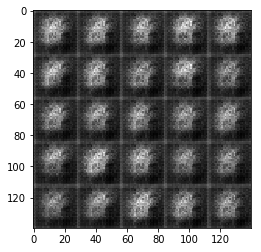

Epoch 1/2... Discriminator Loss: 0.5029... Generator Loss: 2.3127
Epoch 1/2... Discriminator Loss: 0.5758... Generator Loss: 3.3677
Epoch 1/2... Discriminator Loss: 0.5060... Generator Loss: 2.0296
Epoch 1/2... Discriminator Loss: 0.5867... Generator Loss: 1.5718
Epoch 1/2... Discriminator Loss: 0.5671... Generator Loss: 2.0529
Epoch 1/2... Discriminator Loss: 2.6882... Generator Loss: 0.1383
Epoch 1/2... Discriminator Loss: 0.8651... Generator Loss: 1.9436
Epoch 1/2... Discriminator Loss: 0.8377... Generator Loss: 1.6479
Epoch 1/2... Discriminator Loss: 1.2042... Generator Loss: 0.7346
Epoch 1/2... Discriminator Loss: 0.8127... Generator Loss: 1.4740


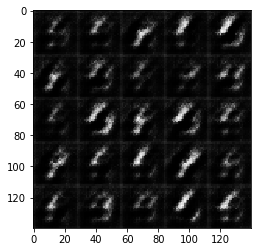

Epoch 1/2... Discriminator Loss: 0.9262... Generator Loss: 1.2253
Epoch 1/2... Discriminator Loss: 0.6573... Generator Loss: 1.7401
Epoch 1/2... Discriminator Loss: 0.7345... Generator Loss: 1.8702
Epoch 1/2... Discriminator Loss: 1.1444... Generator Loss: 0.8196
Epoch 1/2... Discriminator Loss: 0.6329... Generator Loss: 2.0237
Epoch 1/2... Discriminator Loss: 2.0915... Generator Loss: 0.2344
Epoch 1/2... Discriminator Loss: 0.8642... Generator Loss: 2.1907
Epoch 1/2... Discriminator Loss: 1.0345... Generator Loss: 3.0951
Epoch 1/2... Discriminator Loss: 1.1081... Generator Loss: 0.8270
Epoch 1/2... Discriminator Loss: 1.1852... Generator Loss: 2.0276


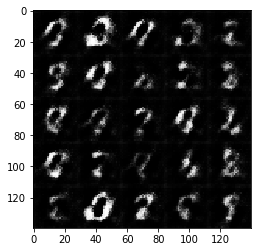

Epoch 1/2... Discriminator Loss: 1.5523... Generator Loss: 0.4310
Epoch 1/2... Discriminator Loss: 1.0232... Generator Loss: 1.5836
Epoch 1/2... Discriminator Loss: 1.0127... Generator Loss: 2.0601
Epoch 1/2... Discriminator Loss: 1.2510... Generator Loss: 0.7913
Epoch 1/2... Discriminator Loss: 1.0140... Generator Loss: 1.3826
Epoch 1/2... Discriminator Loss: 1.0936... Generator Loss: 1.6634
Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 1.4275
Epoch 1/2... Discriminator Loss: 0.9506... Generator Loss: 1.2191
Epoch 1/2... Discriminator Loss: 1.6118... Generator Loss: 0.5374
Epoch 1/2... Discriminator Loss: 0.9219... Generator Loss: 1.5185


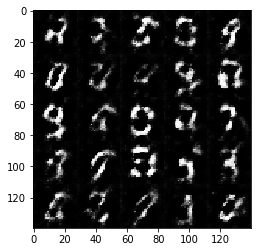

Epoch 1/2... Discriminator Loss: 1.0099... Generator Loss: 1.2640
Epoch 1/2... Discriminator Loss: 0.9079... Generator Loss: 1.0446
Epoch 1/2... Discriminator Loss: 1.1885... Generator Loss: 0.8110
Epoch 1/2... Discriminator Loss: 1.0029... Generator Loss: 0.9224
Epoch 1/2... Discriminator Loss: 1.3821... Generator Loss: 0.5925
Epoch 1/2... Discriminator Loss: 1.5917... Generator Loss: 0.4076
Epoch 1/2... Discriminator Loss: 1.0291... Generator Loss: 1.8728
Epoch 1/2... Discriminator Loss: 0.8833... Generator Loss: 1.7365
Epoch 1/2... Discriminator Loss: 1.6512... Generator Loss: 0.4900
Epoch 1/2... Discriminator Loss: 0.8842... Generator Loss: 1.7971


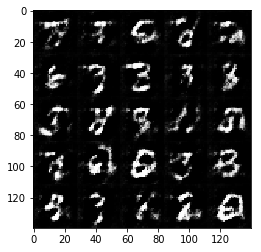

Epoch 1/2... Discriminator Loss: 1.0337... Generator Loss: 1.0620
Epoch 1/2... Discriminator Loss: 1.3200... Generator Loss: 0.7305
Epoch 1/2... Discriminator Loss: 0.9198... Generator Loss: 1.3584
Epoch 1/2... Discriminator Loss: 1.0428... Generator Loss: 0.8774
Epoch 1/2... Discriminator Loss: 1.1311... Generator Loss: 0.8780
Epoch 1/2... Discriminator Loss: 0.9641... Generator Loss: 0.9926
Epoch 1/2... Discriminator Loss: 0.9537... Generator Loss: 0.9820
Epoch 1/2... Discriminator Loss: 1.2793... Generator Loss: 0.5698
Epoch 1/2... Discriminator Loss: 1.1211... Generator Loss: 0.7144
Epoch 1/2... Discriminator Loss: 1.5230... Generator Loss: 0.4157


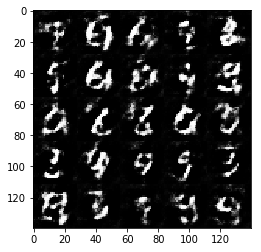

Epoch 1/2... Discriminator Loss: 1.5729... Generator Loss: 0.3811
Epoch 1/2... Discriminator Loss: 1.1142... Generator Loss: 0.7570
Epoch 1/2... Discriminator Loss: 1.3926... Generator Loss: 0.5242
Epoch 1/2... Discriminator Loss: 1.1152... Generator Loss: 2.3009
Epoch 1/2... Discriminator Loss: 0.9449... Generator Loss: 1.5631
Epoch 1/2... Discriminator Loss: 0.9810... Generator Loss: 1.2444
Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 1.4516
Epoch 1/2... Discriminator Loss: 1.3332... Generator Loss: 0.6655
Epoch 1/2... Discriminator Loss: 1.1308... Generator Loss: 0.7997
Epoch 1/2... Discriminator Loss: 1.1994... Generator Loss: 0.6367


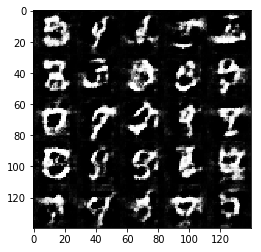

Epoch 1/2... Discriminator Loss: 1.0655... Generator Loss: 0.8648
Epoch 1/2... Discriminator Loss: 1.1357... Generator Loss: 0.8359
Epoch 1/2... Discriminator Loss: 0.9901... Generator Loss: 1.0583
Epoch 1/2... Discriminator Loss: 1.1635... Generator Loss: 1.3072
Epoch 1/2... Discriminator Loss: 0.9672... Generator Loss: 1.5598
Epoch 1/2... Discriminator Loss: 1.2494... Generator Loss: 0.6483
Epoch 1/2... Discriminator Loss: 0.8725... Generator Loss: 1.2323
Epoch 1/2... Discriminator Loss: 1.3149... Generator Loss: 2.5222
Epoch 1/2... Discriminator Loss: 1.5076... Generator Loss: 0.4078
Epoch 1/2... Discriminator Loss: 1.1028... Generator Loss: 2.5706


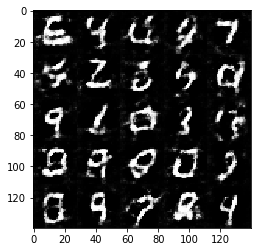

Epoch 1/2... Discriminator Loss: 1.1450... Generator Loss: 0.9648
Epoch 1/2... Discriminator Loss: 0.9460... Generator Loss: 1.1715
Epoch 1/2... Discriminator Loss: 0.9151... Generator Loss: 1.4707
Epoch 1/2... Discriminator Loss: 1.3725... Generator Loss: 0.5159
Epoch 1/2... Discriminator Loss: 1.0805... Generator Loss: 1.5525
Epoch 1/2... Discriminator Loss: 1.0867... Generator Loss: 1.3221
Epoch 1/2... Discriminator Loss: 1.2619... Generator Loss: 0.5898
Epoch 1/2... Discriminator Loss: 1.2923... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 1.5018... Generator Loss: 0.4422
Epoch 1/2... Discriminator Loss: 1.2088... Generator Loss: 1.3034


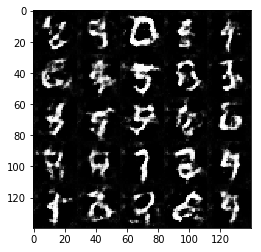

Epoch 1/2... Discriminator Loss: 0.9111... Generator Loss: 1.1782
Epoch 1/2... Discriminator Loss: 1.0919... Generator Loss: 0.7880
Epoch 1/2... Discriminator Loss: 0.9683... Generator Loss: 1.2434
Epoch 1/2... Discriminator Loss: 1.2375... Generator Loss: 0.6566
Epoch 1/2... Discriminator Loss: 1.0557... Generator Loss: 0.8324
Epoch 1/2... Discriminator Loss: 1.4139... Generator Loss: 0.5169
Epoch 1/2... Discriminator Loss: 1.2107... Generator Loss: 0.6251
Epoch 1/2... Discriminator Loss: 1.2510... Generator Loss: 2.0921
Epoch 1/2... Discriminator Loss: 0.8214... Generator Loss: 1.6458
Epoch 1/2... Discriminator Loss: 1.5080... Generator Loss: 0.4981


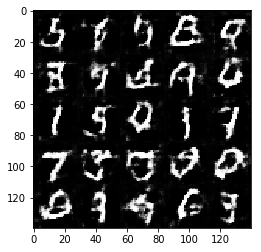

Epoch 1/2... Discriminator Loss: 1.0141... Generator Loss: 1.1625
Epoch 1/2... Discriminator Loss: 0.9722... Generator Loss: 0.9503
Epoch 1/2... Discriminator Loss: 0.8490... Generator Loss: 1.4039
Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 1.4897
Epoch 1/2... Discriminator Loss: 1.0594... Generator Loss: 1.0370
Epoch 1/2... Discriminator Loss: 1.1407... Generator Loss: 0.8376
Epoch 1/2... Discriminator Loss: 1.6398... Generator Loss: 0.4122
Epoch 1/2... Discriminator Loss: 1.0858... Generator Loss: 1.4103
Epoch 1/2... Discriminator Loss: 0.9624... Generator Loss: 1.7566
Epoch 1/2... Discriminator Loss: 1.4008... Generator Loss: 0.4916


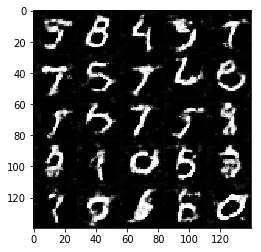

Epoch 1/2... Discriminator Loss: 0.8549... Generator Loss: 1.7572
Epoch 1/2... Discriminator Loss: 0.9799... Generator Loss: 1.1101
Epoch 1/2... Discriminator Loss: 0.8763... Generator Loss: 1.2028
Epoch 1/2... Discriminator Loss: 0.9863... Generator Loss: 1.5767
Epoch 1/2... Discriminator Loss: 1.4901... Generator Loss: 0.4253
Epoch 1/2... Discriminator Loss: 0.9850... Generator Loss: 0.9257
Epoch 1/2... Discriminator Loss: 1.2491... Generator Loss: 0.5791
Epoch 1/2... Discriminator Loss: 1.0014... Generator Loss: 1.1042
Epoch 1/2... Discriminator Loss: 1.2729... Generator Loss: 0.5766
Epoch 1/2... Discriminator Loss: 1.2793... Generator Loss: 0.6013


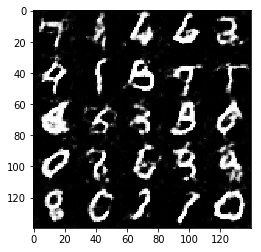

Epoch 1/2... Discriminator Loss: 1.1520... Generator Loss: 0.8537
Epoch 1/2... Discriminator Loss: 0.9380... Generator Loss: 1.1706
Epoch 1/2... Discriminator Loss: 1.4876... Generator Loss: 0.4662
Epoch 1/2... Discriminator Loss: 1.8759... Generator Loss: 0.2594
Epoch 1/2... Discriminator Loss: 1.0467... Generator Loss: 0.7678
Epoch 1/2... Discriminator Loss: 0.8195... Generator Loss: 1.4268
Epoch 1/2... Discriminator Loss: 1.0745... Generator Loss: 0.8205
Epoch 1/2... Discriminator Loss: 0.9461... Generator Loss: 1.1374
Epoch 1/2... Discriminator Loss: 1.3027... Generator Loss: 0.5638
Epoch 1/2... Discriminator Loss: 0.9895... Generator Loss: 1.1923


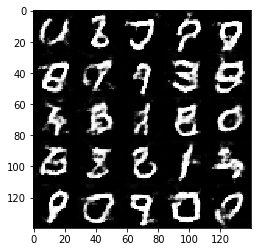

Epoch 1/2... Discriminator Loss: 1.5972... Generator Loss: 0.3896
Epoch 1/2... Discriminator Loss: 1.1742... Generator Loss: 0.7180
Epoch 1/2... Discriminator Loss: 0.9287... Generator Loss: 1.1179
Epoch 1/2... Discriminator Loss: 0.8606... Generator Loss: 1.3301
Epoch 1/2... Discriminator Loss: 1.2088... Generator Loss: 1.5916
Epoch 1/2... Discriminator Loss: 1.4498... Generator Loss: 0.4644
Epoch 1/2... Discriminator Loss: 1.6558... Generator Loss: 0.3404
Epoch 1/2... Discriminator Loss: 0.8460... Generator Loss: 1.4779
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.6168
Epoch 1/2... Discriminator Loss: 0.8918... Generator Loss: 1.1875


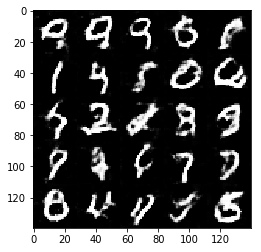

Epoch 1/2... Discriminator Loss: 1.7605... Generator Loss: 0.3118
Epoch 1/2... Discriminator Loss: 1.1429... Generator Loss: 0.6978
Epoch 1/2... Discriminator Loss: 1.0659... Generator Loss: 0.7509
Epoch 1/2... Discriminator Loss: 0.9858... Generator Loss: 1.6893
Epoch 1/2... Discriminator Loss: 1.6185... Generator Loss: 0.4137
Epoch 1/2... Discriminator Loss: 1.2376... Generator Loss: 0.5899
Epoch 1/2... Discriminator Loss: 1.3745... Generator Loss: 0.4961
Epoch 1/2... Discriminator Loss: 1.2701... Generator Loss: 0.6389
Epoch 1/2... Discriminator Loss: 0.9310... Generator Loss: 1.1463
Epoch 1/2... Discriminator Loss: 1.0095... Generator Loss: 1.3353


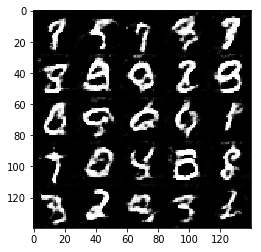

Epoch 1/2... Discriminator Loss: 1.4880... Generator Loss: 2.2242
Epoch 1/2... Discriminator Loss: 1.3253... Generator Loss: 0.5369
Epoch 1/2... Discriminator Loss: 1.0515... Generator Loss: 0.8540
Epoch 1/2... Discriminator Loss: 1.2254... Generator Loss: 0.5695
Epoch 1/2... Discriminator Loss: 0.7633... Generator Loss: 1.3105
Epoch 1/2... Discriminator Loss: 1.3658... Generator Loss: 0.5304
Epoch 1/2... Discriminator Loss: 0.9685... Generator Loss: 0.9350
Epoch 1/2... Discriminator Loss: 0.9436... Generator Loss: 0.9820
Epoch 1/2... Discriminator Loss: 0.9681... Generator Loss: 0.8734
Epoch 1/2... Discriminator Loss: 2.0505... Generator Loss: 0.2451


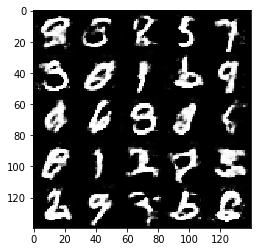

Epoch 1/2... Discriminator Loss: 1.5571... Generator Loss: 0.3850
Epoch 1/2... Discriminator Loss: 0.9818... Generator Loss: 0.8776
Epoch 1/2... Discriminator Loss: 1.2530... Generator Loss: 0.5517
Epoch 1/2... Discriminator Loss: 1.7637... Generator Loss: 0.3206
Epoch 1/2... Discriminator Loss: 0.8997... Generator Loss: 1.3046
Epoch 1/2... Discriminator Loss: 1.0618... Generator Loss: 0.8516
Epoch 1/2... Discriminator Loss: 0.6442... Generator Loss: 1.7514
Epoch 1/2... Discriminator Loss: 0.8619... Generator Loss: 1.5615
Epoch 1/2... Discriminator Loss: 0.8239... Generator Loss: 1.2433
Epoch 1/2... Discriminator Loss: 0.9188... Generator Loss: 1.4515


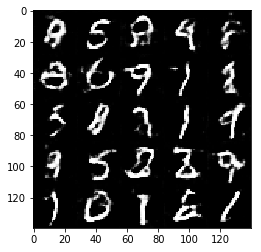

Epoch 1/2... Discriminator Loss: 0.7707... Generator Loss: 1.3753
Epoch 1/2... Discriminator Loss: 0.9818... Generator Loss: 0.8375
Epoch 1/2... Discriminator Loss: 1.3717... Generator Loss: 2.5507
Epoch 1/2... Discriminator Loss: 1.0506... Generator Loss: 0.8063
Epoch 1/2... Discriminator Loss: 1.1877... Generator Loss: 0.6283
Epoch 1/2... Discriminator Loss: 1.0598... Generator Loss: 0.8444
Epoch 1/2... Discriminator Loss: 0.8281... Generator Loss: 1.4203
Epoch 1/2... Discriminator Loss: 1.0032... Generator Loss: 0.7990
Epoch 1/2... Discriminator Loss: 0.8415... Generator Loss: 1.0113
Epoch 1/2... Discriminator Loss: 0.8581... Generator Loss: 1.0541


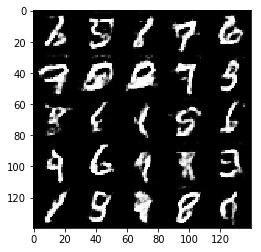

Epoch 1/2... Discriminator Loss: 0.6701... Generator Loss: 1.4786
Epoch 1/2... Discriminator Loss: 1.0468... Generator Loss: 0.8459
Epoch 1/2... Discriminator Loss: 0.8752... Generator Loss: 1.0878
Epoch 1/2... Discriminator Loss: 1.1633... Generator Loss: 0.6802
Epoch 1/2... Discriminator Loss: 1.9014... Generator Loss: 0.2897
Epoch 1/2... Discriminator Loss: 1.6795... Generator Loss: 0.3979
Epoch 1/2... Discriminator Loss: 1.2966... Generator Loss: 0.5832
Epoch 1/2... Discriminator Loss: 1.0420... Generator Loss: 0.8197
Epoch 1/2... Discriminator Loss: 0.8612... Generator Loss: 1.1600
Epoch 1/2... Discriminator Loss: 1.0078... Generator Loss: 0.8536


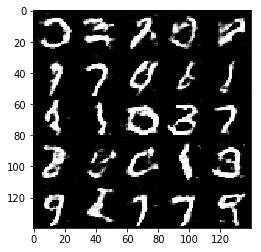

Epoch 1/2... Discriminator Loss: 1.2710... Generator Loss: 2.6146
Epoch 1/2... Discriminator Loss: 0.8486... Generator Loss: 2.2972
Epoch 1/2... Discriminator Loss: 0.7884... Generator Loss: 1.2093
Epoch 1/2... Discriminator Loss: 1.1120... Generator Loss: 0.7275
Epoch 1/2... Discriminator Loss: 0.8691... Generator Loss: 1.5873
Epoch 1/2... Discriminator Loss: 0.7844... Generator Loss: 1.3858
Epoch 1/2... Discriminator Loss: 1.6947... Generator Loss: 0.4380
Epoch 1/2... Discriminator Loss: 0.7934... Generator Loss: 1.1628
Epoch 1/2... Discriminator Loss: 0.9937... Generator Loss: 0.8394
Epoch 1/2... Discriminator Loss: 0.7454... Generator Loss: 1.4115


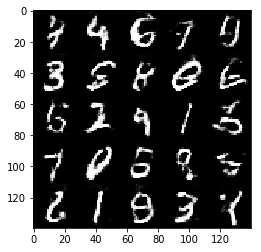

Epoch 1/2... Discriminator Loss: 1.4697... Generator Loss: 0.4430
Epoch 1/2... Discriminator Loss: 0.7220... Generator Loss: 1.5626
Epoch 1/2... Discriminator Loss: 0.7511... Generator Loss: 1.3775
Epoch 1/2... Discriminator Loss: 0.6990... Generator Loss: 1.6160
Epoch 1/2... Discriminator Loss: 1.6205... Generator Loss: 0.4061
Epoch 1/2... Discriminator Loss: 0.6496... Generator Loss: 2.0432
Epoch 1/2... Discriminator Loss: 1.1399... Generator Loss: 0.7316
Epoch 1/2... Discriminator Loss: 1.2434... Generator Loss: 0.6483
Epoch 1/2... Discriminator Loss: 0.6015... Generator Loss: 1.6108
Epoch 1/2... Discriminator Loss: 1.8052... Generator Loss: 0.3371


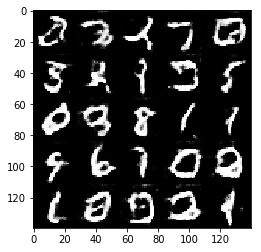

Epoch 1/2... Discriminator Loss: 1.4998... Generator Loss: 0.4600
Epoch 1/2... Discriminator Loss: 1.4627... Generator Loss: 0.4700
Epoch 1/2... Discriminator Loss: 2.2053... Generator Loss: 0.2317
Epoch 1/2... Discriminator Loss: 1.1814... Generator Loss: 0.7023
Epoch 1/2... Discriminator Loss: 0.8797... Generator Loss: 1.0230
Epoch 1/2... Discriminator Loss: 1.1557... Generator Loss: 0.7087
Epoch 1/2... Discriminator Loss: 1.4779... Generator Loss: 0.4477
Epoch 1/2... Discriminator Loss: 0.8319... Generator Loss: 1.0821
Epoch 1/2... Discriminator Loss: 0.8207... Generator Loss: 1.1414
Epoch 1/2... Discriminator Loss: 0.7705... Generator Loss: 1.0894


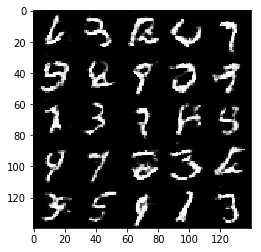

Epoch 1/2... Discriminator Loss: 0.7087... Generator Loss: 1.4600
Epoch 1/2... Discriminator Loss: 1.0613... Generator Loss: 0.8873
Epoch 1/2... Discriminator Loss: 0.7754... Generator Loss: 1.4359
Epoch 1/2... Discriminator Loss: 1.6137... Generator Loss: 0.4733
Epoch 1/2... Discriminator Loss: 1.6281... Generator Loss: 0.3694
Epoch 1/2... Discriminator Loss: 0.9957... Generator Loss: 0.9095
Epoch 1/2... Discriminator Loss: 0.6386... Generator Loss: 1.7692
Epoch 1/2... Discriminator Loss: 0.7142... Generator Loss: 1.7895
Epoch 1/2... Discriminator Loss: 0.9552... Generator Loss: 0.8646
Epoch 1/2... Discriminator Loss: 0.9792... Generator Loss: 0.8763


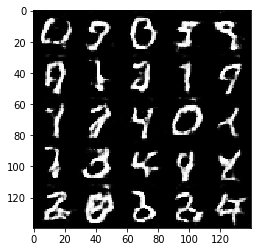

Epoch 1/2... Discriminator Loss: 0.7508... Generator Loss: 1.2512
Epoch 1/2... Discriminator Loss: 1.3844... Generator Loss: 0.6463
Epoch 1/2... Discriminator Loss: 1.1137... Generator Loss: 0.7477
Epoch 1/2... Discriminator Loss: 0.7788... Generator Loss: 1.5315
Epoch 1/2... Discriminator Loss: 0.6941... Generator Loss: 2.2006
Epoch 1/2... Discriminator Loss: 0.9354... Generator Loss: 0.9281
Epoch 1/2... Discriminator Loss: 0.9080... Generator Loss: 1.1722
Epoch 1/2... Discriminator Loss: 1.2018... Generator Loss: 2.3092
Epoch 1/2... Discriminator Loss: 0.7709... Generator Loss: 1.2127
Epoch 1/2... Discriminator Loss: 0.9574... Generator Loss: 0.8591


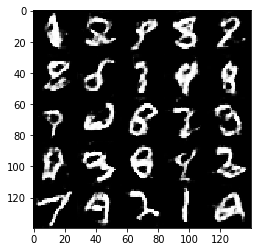

Epoch 1/2... Discriminator Loss: 1.0265... Generator Loss: 0.8057
Epoch 1/2... Discriminator Loss: 0.7215... Generator Loss: 1.3598
Epoch 1/2... Discriminator Loss: 1.0063... Generator Loss: 0.7967
Epoch 1/2... Discriminator Loss: 0.8059... Generator Loss: 1.2497
Epoch 1/2... Discriminator Loss: 0.7115... Generator Loss: 2.3763
Epoch 1/2... Discriminator Loss: 1.0493... Generator Loss: 0.7880
Epoch 1/2... Discriminator Loss: 1.4823... Generator Loss: 0.5171
Epoch 1/2... Discriminator Loss: 0.8114... Generator Loss: 1.0931
Epoch 1/2... Discriminator Loss: 1.1368... Generator Loss: 0.6687
Epoch 1/2... Discriminator Loss: 0.9584... Generator Loss: 1.1276


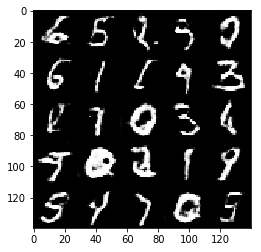

Epoch 1/2... Discriminator Loss: 1.8121... Generator Loss: 0.3737
Epoch 1/2... Discriminator Loss: 1.8698... Generator Loss: 0.2992
Epoch 1/2... Discriminator Loss: 1.4605... Generator Loss: 0.4753
Epoch 1/2... Discriminator Loss: 1.1861... Generator Loss: 0.6112
Epoch 1/2... Discriminator Loss: 0.7181... Generator Loss: 1.2481
Epoch 1/2... Discriminator Loss: 0.7469... Generator Loss: 1.2673
Epoch 1/2... Discriminator Loss: 1.0162... Generator Loss: 0.8206
Epoch 1/2... Discriminator Loss: 0.5896... Generator Loss: 2.0907
Epoch 1/2... Discriminator Loss: 0.7770... Generator Loss: 2.6723
Epoch 1/2... Discriminator Loss: 0.6316... Generator Loss: 2.6809


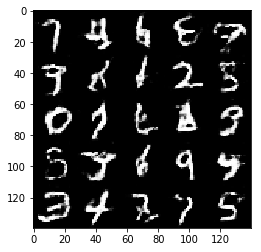

Epoch 1/2... Discriminator Loss: 0.6471... Generator Loss: 1.6270
Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 0.7499
Epoch 1/2... Discriminator Loss: 1.1912... Generator Loss: 0.6687
Epoch 1/2... Discriminator Loss: 0.6474... Generator Loss: 1.4424
Epoch 1/2... Discriminator Loss: 1.6993... Generator Loss: 0.4412
Epoch 1/2... Discriminator Loss: 1.3025... Generator Loss: 0.5761
Epoch 1/2... Discriminator Loss: 0.8005... Generator Loss: 1.1809
Epoch 1/2... Discriminator Loss: 0.9695... Generator Loss: 1.0170
Epoch 1/2... Discriminator Loss: 0.6062... Generator Loss: 1.5949
Epoch 1/2... Discriminator Loss: 1.5528... Generator Loss: 0.4726


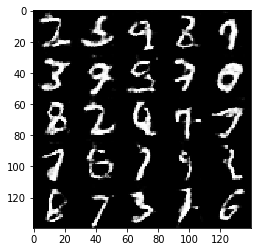

Epoch 1/2... Discriminator Loss: 1.8392... Generator Loss: 0.3250
Epoch 1/2... Discriminator Loss: 0.8441... Generator Loss: 1.0210
Epoch 1/2... Discriminator Loss: 0.8122... Generator Loss: 1.1169
Epoch 1/2... Discriminator Loss: 1.4601... Generator Loss: 0.4986
Epoch 1/2... Discriminator Loss: 0.6249... Generator Loss: 1.5790
Epoch 1/2... Discriminator Loss: 1.2344... Generator Loss: 0.5797
Epoch 1/2... Discriminator Loss: 1.2062... Generator Loss: 0.7147
Epoch 1/2... Discriminator Loss: 0.6696... Generator Loss: 1.5109
Epoch 1/2... Discriminator Loss: 0.9682... Generator Loss: 0.8258
Epoch 1/2... Discriminator Loss: 0.7257... Generator Loss: 1.6921


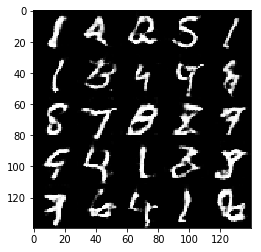

Epoch 1/2... Discriminator Loss: 1.1919... Generator Loss: 0.7759
Epoch 1/2... Discriminator Loss: 1.2860... Generator Loss: 0.5732
Epoch 1/2... Discriminator Loss: 1.3848... Generator Loss: 0.5612
Epoch 1/2... Discriminator Loss: 0.7027... Generator Loss: 1.2941
Epoch 1/2... Discriminator Loss: 1.6406... Generator Loss: 0.3895
Epoch 1/2... Discriminator Loss: 0.8968... Generator Loss: 1.0388
Epoch 1/2... Discriminator Loss: 0.9919... Generator Loss: 0.9821
Epoch 1/2... Discriminator Loss: 0.7763... Generator Loss: 1.1155
Epoch 1/2... Discriminator Loss: 0.7006... Generator Loss: 1.4199
Epoch 1/2... Discriminator Loss: 0.9094... Generator Loss: 0.9522


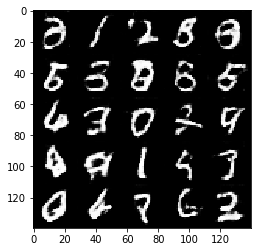

Epoch 1/2... Discriminator Loss: 0.5604... Generator Loss: 2.1542
Epoch 1/2... Discriminator Loss: 0.6981... Generator Loss: 1.5332
Epoch 1/2... Discriminator Loss: 1.5868... Generator Loss: 0.4525
Epoch 1/2... Discriminator Loss: 1.7997... Generator Loss: 0.3258
Epoch 1/2... Discriminator Loss: 1.0120... Generator Loss: 0.8572
Epoch 1/2... Discriminator Loss: 0.8737... Generator Loss: 1.0414
Epoch 1/2... Discriminator Loss: 1.1299... Generator Loss: 0.6782
Epoch 1/2... Discriminator Loss: 0.7249... Generator Loss: 1.3085
Epoch 1/2... Discriminator Loss: 1.2051... Generator Loss: 0.6486
Epoch 1/2... Discriminator Loss: 0.7618... Generator Loss: 1.2427


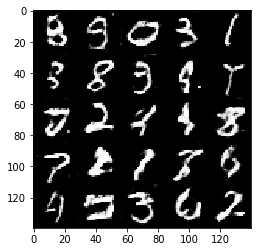

Epoch 1/2... Discriminator Loss: 0.7583... Generator Loss: 1.2352
Epoch 1/2... Discriminator Loss: 0.8756... Generator Loss: 0.9895
Epoch 1/2... Discriminator Loss: 1.0456... Generator Loss: 0.8642
Epoch 1/2... Discriminator Loss: 0.6890... Generator Loss: 1.4256
Epoch 1/2... Discriminator Loss: 1.2445... Generator Loss: 0.6225
Epoch 1/2... Discriminator Loss: 0.6448... Generator Loss: 1.7243
Epoch 1/2... Discriminator Loss: 1.1104... Generator Loss: 1.9951
Epoch 1/2... Discriminator Loss: 0.8795... Generator Loss: 0.9884
Epoch 1/2... Discriminator Loss: 0.6462... Generator Loss: 1.5628
Epoch 1/2... Discriminator Loss: 0.9408... Generator Loss: 0.9380


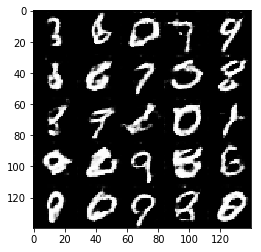

Epoch 1/2... Discriminator Loss: 0.9670... Generator Loss: 0.8533
Epoch 1/2... Discriminator Loss: 0.6827... Generator Loss: 1.4155
Epoch 1/2... Discriminator Loss: 0.5655... Generator Loss: 1.7959
Epoch 1/2... Discriminator Loss: 0.9464... Generator Loss: 1.0301
Epoch 1/2... Discriminator Loss: 1.2514... Generator Loss: 0.6768
Epoch 1/2... Discriminator Loss: 0.6450... Generator Loss: 1.5228
Epoch 1/2... Discriminator Loss: 1.2499... Generator Loss: 0.5822
Epoch 1/2... Discriminator Loss: 0.7294... Generator Loss: 1.2409
Epoch 1/2... Discriminator Loss: 3.1660... Generator Loss: 0.1051
Epoch 1/2... Discriminator Loss: 1.0786... Generator Loss: 1.8164


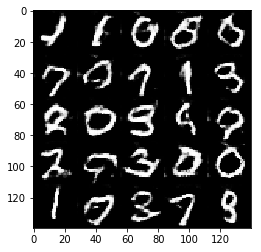

Epoch 1/2... Discriminator Loss: 1.0956... Generator Loss: 0.8413
Epoch 1/2... Discriminator Loss: 0.8785... Generator Loss: 1.2434
Epoch 1/2... Discriminator Loss: 1.0761... Generator Loss: 0.7842
Epoch 1/2... Discriminator Loss: 0.6205... Generator Loss: 1.8986
Epoch 1/2... Discriminator Loss: 1.8026... Generator Loss: 0.3510
Epoch 1/2... Discriminator Loss: 0.6182... Generator Loss: 1.6404
Epoch 1/2... Discriminator Loss: 0.7681... Generator Loss: 1.2884
Epoch 1/2... Discriminator Loss: 0.6974... Generator Loss: 1.4795
Epoch 1/2... Discriminator Loss: 1.1517... Generator Loss: 0.7921
Epoch 1/2... Discriminator Loss: 0.6877... Generator Loss: 1.4360


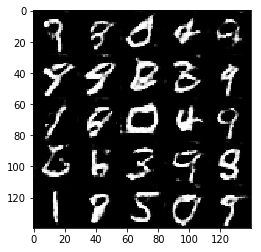

Epoch 1/2... Discriminator Loss: 0.7702... Generator Loss: 1.4316
Epoch 1/2... Discriminator Loss: 0.5445... Generator Loss: 2.0527
Epoch 1/2... Discriminator Loss: 0.7446... Generator Loss: 1.4998
Epoch 1/2... Discriminator Loss: 0.8003... Generator Loss: 1.2432
Epoch 1/2... Discriminator Loss: 0.5767... Generator Loss: 2.1200
Epoch 1/2... Discriminator Loss: 1.1392... Generator Loss: 0.6729
Epoch 1/2... Discriminator Loss: 0.6107... Generator Loss: 1.6408
Epoch 1/2... Discriminator Loss: 0.7859... Generator Loss: 1.1326
Epoch 1/2... Discriminator Loss: 1.3028... Generator Loss: 0.6115
Epoch 1/2... Discriminator Loss: 0.8847... Generator Loss: 0.9645


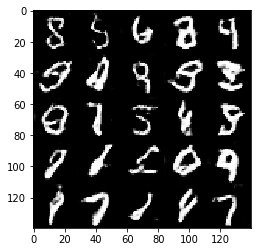

Epoch 1/2... Discriminator Loss: 0.8288... Generator Loss: 1.1723
Epoch 1/2... Discriminator Loss: 1.0984... Generator Loss: 0.9733
Epoch 1/2... Discriminator Loss: 0.6873... Generator Loss: 1.3560
Epoch 1/2... Discriminator Loss: 0.8737... Generator Loss: 1.0903
Epoch 1/2... Discriminator Loss: 0.9108... Generator Loss: 1.0566
Epoch 1/2... Discriminator Loss: 0.5434... Generator Loss: 2.9287
Epoch 1/2... Discriminator Loss: 1.5782... Generator Loss: 0.5888
Epoch 1/2... Discriminator Loss: 0.8019... Generator Loss: 1.1361
Epoch 1/2... Discriminator Loss: 0.6306... Generator Loss: 1.9410
Epoch 1/2... Discriminator Loss: 0.6937... Generator Loss: 1.8069


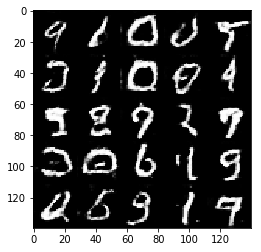

Epoch 1/2... Discriminator Loss: 0.9056... Generator Loss: 0.9556
Epoch 1/2... Discriminator Loss: 0.4929... Generator Loss: 2.1982
Epoch 1/2... Discriminator Loss: 0.6576... Generator Loss: 1.4706
Epoch 1/2... Discriminator Loss: 0.7292... Generator Loss: 1.3425
Epoch 1/2... Discriminator Loss: 1.3624... Generator Loss: 0.5463
Epoch 1/2... Discriminator Loss: 0.8975... Generator Loss: 0.9777
Epoch 1/2... Discriminator Loss: 0.9156... Generator Loss: 0.9763
Epoch 1/2... Discriminator Loss: 0.5649... Generator Loss: 1.8445
Epoch 1/2... Discriminator Loss: 0.7932... Generator Loss: 1.2722
Epoch 1/2... Discriminator Loss: 0.6954... Generator Loss: 1.4874


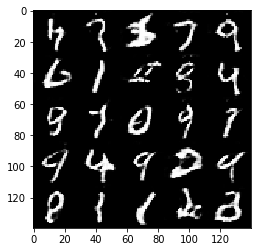

Epoch 1/2... Discriminator Loss: 1.1756... Generator Loss: 0.9694
Epoch 1/2... Discriminator Loss: 2.5740... Generator Loss: 0.1753
Epoch 1/2... Discriminator Loss: 0.7743... Generator Loss: 1.2247
Epoch 1/2... Discriminator Loss: 0.9461... Generator Loss: 0.8723
Epoch 1/2... Discriminator Loss: 1.1187... Generator Loss: 0.7324
Epoch 1/2... Discriminator Loss: 0.6236... Generator Loss: 1.6445
Epoch 1/2... Discriminator Loss: 0.8498... Generator Loss: 1.0361
Epoch 1/2... Discriminator Loss: 2.0553... Generator Loss: 4.3371
Epoch 1/2... Discriminator Loss: 1.3108... Generator Loss: 0.5869
Epoch 1/2... Discriminator Loss: 1.0179... Generator Loss: 0.8333


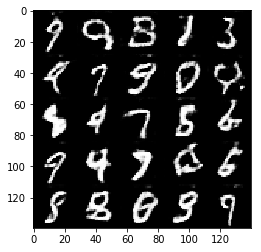

Epoch 1/2... Discriminator Loss: 0.8383... Generator Loss: 1.6083
Epoch 1/2... Discriminator Loss: 0.8910... Generator Loss: 0.9138
Epoch 1/2... Discriminator Loss: 1.0339... Generator Loss: 0.9483
Epoch 1/2... Discriminator Loss: 0.9535... Generator Loss: 0.9789
Epoch 1/2... Discriminator Loss: 0.9234... Generator Loss: 0.9297
Epoch 2/2... Discriminator Loss: 1.0817... Generator Loss: 0.8330
Epoch 2/2... Discriminator Loss: 1.2330... Generator Loss: 0.6277
Epoch 2/2... Discriminator Loss: 0.6140... Generator Loss: 1.8565
Epoch 2/2... Discriminator Loss: 0.4342... Generator Loss: 2.7066
Epoch 2/2... Discriminator Loss: 1.6270... Generator Loss: 0.4033


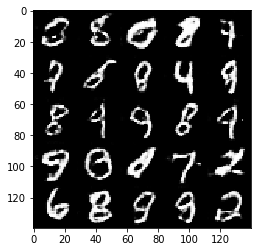

Epoch 2/2... Discriminator Loss: 1.1269... Generator Loss: 0.7695
Epoch 2/2... Discriminator Loss: 0.6161... Generator Loss: 1.9662
Epoch 2/2... Discriminator Loss: 0.6156... Generator Loss: 1.7573
Epoch 2/2... Discriminator Loss: 0.8226... Generator Loss: 1.1987
Epoch 2/2... Discriminator Loss: 0.8648... Generator Loss: 0.9782
Epoch 2/2... Discriminator Loss: 1.4985... Generator Loss: 4.0602
Epoch 2/2... Discriminator Loss: 0.9283... Generator Loss: 0.9677
Epoch 2/2... Discriminator Loss: 1.1528... Generator Loss: 0.6810
Epoch 2/2... Discriminator Loss: 0.7405... Generator Loss: 1.4065
Epoch 2/2... Discriminator Loss: 0.6944... Generator Loss: 1.5711


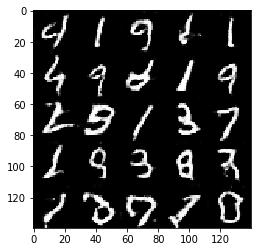

Epoch 2/2... Discriminator Loss: 1.1692... Generator Loss: 3.5425
Epoch 2/2... Discriminator Loss: 1.1187... Generator Loss: 0.7730
Epoch 2/2... Discriminator Loss: 0.5655... Generator Loss: 1.9482
Epoch 2/2... Discriminator Loss: 1.2591... Generator Loss: 0.6318
Epoch 2/2... Discriminator Loss: 1.1406... Generator Loss: 0.7128
Epoch 2/2... Discriminator Loss: 0.7593... Generator Loss: 1.1972
Epoch 2/2... Discriminator Loss: 0.7593... Generator Loss: 1.3353
Epoch 2/2... Discriminator Loss: 0.7037... Generator Loss: 1.5265
Epoch 2/2... Discriminator Loss: 1.0963... Generator Loss: 0.7095
Epoch 2/2... Discriminator Loss: 0.7834... Generator Loss: 1.1950


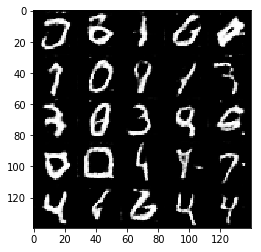

Epoch 2/2... Discriminator Loss: 0.7836... Generator Loss: 2.1033
Epoch 2/2... Discriminator Loss: 0.5231... Generator Loss: 2.2504
Epoch 2/2... Discriminator Loss: 1.4803... Generator Loss: 0.5981
Epoch 2/2... Discriminator Loss: 0.9608... Generator Loss: 0.9339
Epoch 2/2... Discriminator Loss: 1.2916... Generator Loss: 0.6356
Epoch 2/2... Discriminator Loss: 1.2578... Generator Loss: 0.7226
Epoch 2/2... Discriminator Loss: 0.6437... Generator Loss: 1.7904
Epoch 2/2... Discriminator Loss: 0.6890... Generator Loss: 1.4791
Epoch 2/2... Discriminator Loss: 0.9823... Generator Loss: 0.9490
Epoch 2/2... Discriminator Loss: 1.3173... Generator Loss: 0.5924


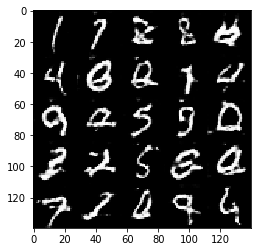

Epoch 2/2... Discriminator Loss: 0.8523... Generator Loss: 1.0949
Epoch 2/2... Discriminator Loss: 0.7332... Generator Loss: 1.3122
Epoch 2/2... Discriminator Loss: 1.5401... Generator Loss: 0.4193
Epoch 2/2... Discriminator Loss: 1.7395... Generator Loss: 0.3992
Epoch 2/2... Discriminator Loss: 0.6925... Generator Loss: 1.5309
Epoch 2/2... Discriminator Loss: 0.6744... Generator Loss: 1.5347
Epoch 2/2... Discriminator Loss: 0.7690... Generator Loss: 1.3070
Epoch 2/2... Discriminator Loss: 1.7270... Generator Loss: 0.3793
Epoch 2/2... Discriminator Loss: 0.9601... Generator Loss: 0.9849
Epoch 2/2... Discriminator Loss: 0.8626... Generator Loss: 0.9380


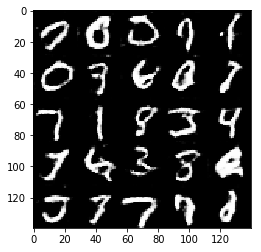

Epoch 2/2... Discriminator Loss: 0.5638... Generator Loss: 1.9084
Epoch 2/2... Discriminator Loss: 0.6985... Generator Loss: 1.3383
Epoch 2/2... Discriminator Loss: 0.7634... Generator Loss: 1.2991
Epoch 2/2... Discriminator Loss: 0.6646... Generator Loss: 1.4924
Epoch 2/2... Discriminator Loss: 1.1258... Generator Loss: 0.7189
Epoch 2/2... Discriminator Loss: 0.6060... Generator Loss: 1.6470
Epoch 2/2... Discriminator Loss: 0.6861... Generator Loss: 1.3220
Epoch 2/2... Discriminator Loss: 0.7249... Generator Loss: 2.0067
Epoch 2/2... Discriminator Loss: 0.6877... Generator Loss: 1.3211
Epoch 2/2... Discriminator Loss: 0.5503... Generator Loss: 2.0425


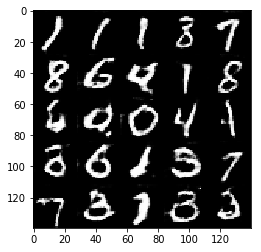

Epoch 2/2... Discriminator Loss: 1.3313... Generator Loss: 0.5743
Epoch 2/2... Discriminator Loss: 0.9131... Generator Loss: 0.9439
Epoch 2/2... Discriminator Loss: 0.7113... Generator Loss: 1.3311
Epoch 2/2... Discriminator Loss: 0.6835... Generator Loss: 1.6088
Epoch 2/2... Discriminator Loss: 0.9663... Generator Loss: 1.0115
Epoch 2/2... Discriminator Loss: 1.1660... Generator Loss: 0.7817
Epoch 2/2... Discriminator Loss: 1.2541... Generator Loss: 0.6795
Epoch 2/2... Discriminator Loss: 1.6310... Generator Loss: 0.4104
Epoch 2/2... Discriminator Loss: 1.9592... Generator Loss: 0.5168
Epoch 2/2... Discriminator Loss: 1.2804... Generator Loss: 0.6277


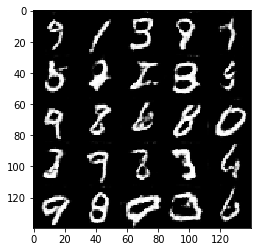

Epoch 2/2... Discriminator Loss: 1.5381... Generator Loss: 0.5296
Epoch 2/2... Discriminator Loss: 0.9677... Generator Loss: 0.8844
Epoch 2/2... Discriminator Loss: 0.7622... Generator Loss: 1.1813
Epoch 2/2... Discriminator Loss: 0.8637... Generator Loss: 1.1513
Epoch 2/2... Discriminator Loss: 0.5437... Generator Loss: 2.0190
Epoch 2/2... Discriminator Loss: 0.6362... Generator Loss: 1.5287
Epoch 2/2... Discriminator Loss: 0.6230... Generator Loss: 1.5333
Epoch 2/2... Discriminator Loss: 1.0075... Generator Loss: 0.8372
Epoch 2/2... Discriminator Loss: 0.7065... Generator Loss: 1.3177
Epoch 2/2... Discriminator Loss: 0.6180... Generator Loss: 1.6580


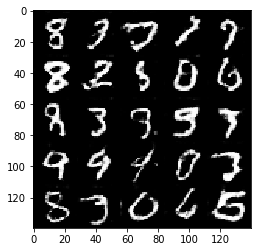

Epoch 2/2... Discriminator Loss: 0.5762... Generator Loss: 1.6641
Epoch 2/2... Discriminator Loss: 0.8840... Generator Loss: 1.0777
Epoch 2/2... Discriminator Loss: 0.6392... Generator Loss: 1.5059
Epoch 2/2... Discriminator Loss: 0.5139... Generator Loss: 2.2210
Epoch 2/2... Discriminator Loss: 1.2232... Generator Loss: 3.4822
Epoch 2/2... Discriminator Loss: 0.9138... Generator Loss: 0.9306
Epoch 2/2... Discriminator Loss: 0.6048... Generator Loss: 1.6059
Epoch 2/2... Discriminator Loss: 1.2190... Generator Loss: 0.5891
Epoch 2/2... Discriminator Loss: 1.4414... Generator Loss: 0.5891
Epoch 2/2... Discriminator Loss: 0.8097... Generator Loss: 1.1569


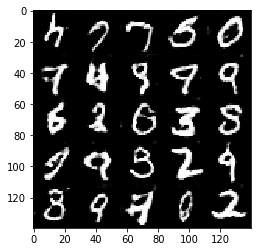

Epoch 2/2... Discriminator Loss: 1.9313... Generator Loss: 0.3972
Epoch 2/2... Discriminator Loss: 0.5550... Generator Loss: 2.1258
Epoch 2/2... Discriminator Loss: 0.7815... Generator Loss: 1.1816
Epoch 2/2... Discriminator Loss: 0.6875... Generator Loss: 2.2052
Epoch 2/2... Discriminator Loss: 0.8556... Generator Loss: 1.0893
Epoch 2/2... Discriminator Loss: 0.5738... Generator Loss: 1.7358
Epoch 2/2... Discriminator Loss: 1.4990... Generator Loss: 0.4601
Epoch 2/2... Discriminator Loss: 0.9411... Generator Loss: 0.9281
Epoch 2/2... Discriminator Loss: 0.8684... Generator Loss: 1.0326
Epoch 2/2... Discriminator Loss: 1.0355... Generator Loss: 0.8950


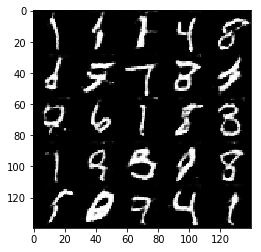

Epoch 2/2... Discriminator Loss: 1.2737... Generator Loss: 0.6719
Epoch 2/2... Discriminator Loss: 0.7941... Generator Loss: 1.2141
Epoch 2/2... Discriminator Loss: 0.5932... Generator Loss: 2.6476
Epoch 2/2... Discriminator Loss: 0.8946... Generator Loss: 3.5965
Epoch 2/2... Discriminator Loss: 1.8361... Generator Loss: 0.3943
Epoch 2/2... Discriminator Loss: 1.0016... Generator Loss: 0.9203
Epoch 2/2... Discriminator Loss: 0.6219... Generator Loss: 1.8425
Epoch 2/2... Discriminator Loss: 0.6978... Generator Loss: 1.4571
Epoch 2/2... Discriminator Loss: 0.5455... Generator Loss: 1.8244
Epoch 2/2... Discriminator Loss: 0.6131... Generator Loss: 2.0333


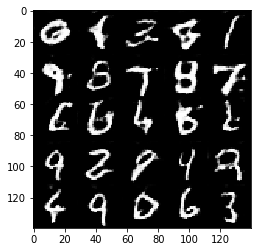

Epoch 2/2... Discriminator Loss: 0.6599... Generator Loss: 1.6681
Epoch 2/2... Discriminator Loss: 0.6750... Generator Loss: 1.5475
Epoch 2/2... Discriminator Loss: 0.7337... Generator Loss: 1.3150
Epoch 2/2... Discriminator Loss: 0.5821... Generator Loss: 2.4346
Epoch 2/2... Discriminator Loss: 1.1121... Generator Loss: 0.7772
Epoch 2/2... Discriminator Loss: 0.9414... Generator Loss: 1.0207
Epoch 2/2... Discriminator Loss: 2.1885... Generator Loss: 0.2634
Epoch 2/2... Discriminator Loss: 1.0706... Generator Loss: 0.7485
Epoch 2/2... Discriminator Loss: 0.9874... Generator Loss: 0.9086
Epoch 2/2... Discriminator Loss: 1.6934... Generator Loss: 0.4450


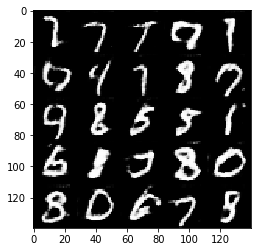

Epoch 2/2... Discriminator Loss: 0.7187... Generator Loss: 2.3658
Epoch 2/2... Discriminator Loss: 0.9254... Generator Loss: 1.0374
Epoch 2/2... Discriminator Loss: 0.5723... Generator Loss: 2.6365
Epoch 2/2... Discriminator Loss: 0.6986... Generator Loss: 1.3676
Epoch 2/2... Discriminator Loss: 0.9568... Generator Loss: 0.8825
Epoch 2/2... Discriminator Loss: 0.8539... Generator Loss: 1.0567
Epoch 2/2... Discriminator Loss: 0.6796... Generator Loss: 1.3895
Epoch 2/2... Discriminator Loss: 1.1753... Generator Loss: 0.7086
Epoch 2/2... Discriminator Loss: 0.6390... Generator Loss: 1.4511
Epoch 2/2... Discriminator Loss: 0.6792... Generator Loss: 1.5803


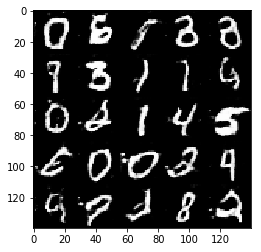

Epoch 2/2... Discriminator Loss: 0.4976... Generator Loss: 2.6463
Epoch 2/2... Discriminator Loss: 0.5117... Generator Loss: 2.1284
Epoch 2/2... Discriminator Loss: 0.9745... Generator Loss: 0.9072
Epoch 2/2... Discriminator Loss: 1.1687... Generator Loss: 0.6645
Epoch 2/2... Discriminator Loss: 0.4714... Generator Loss: 2.3599
Epoch 2/2... Discriminator Loss: 0.6360... Generator Loss: 1.5913
Epoch 2/2... Discriminator Loss: 1.1582... Generator Loss: 1.2329
Epoch 2/2... Discriminator Loss: 0.6974... Generator Loss: 1.6302
Epoch 2/2... Discriminator Loss: 0.6987... Generator Loss: 1.3433
Epoch 2/2... Discriminator Loss: 0.8512... Generator Loss: 0.9992


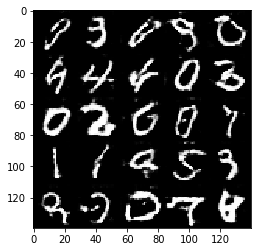

Epoch 2/2... Discriminator Loss: 0.7385... Generator Loss: 1.2741
Epoch 2/2... Discriminator Loss: 1.4526... Generator Loss: 0.5016
Epoch 2/2... Discriminator Loss: 0.7412... Generator Loss: 1.2289
Epoch 2/2... Discriminator Loss: 1.2472... Generator Loss: 0.7012
Epoch 2/2... Discriminator Loss: 0.8685... Generator Loss: 1.0368
Epoch 2/2... Discriminator Loss: 0.6114... Generator Loss: 1.6368
Epoch 2/2... Discriminator Loss: 0.5021... Generator Loss: 2.3373
Epoch 2/2... Discriminator Loss: 0.7484... Generator Loss: 1.5866
Epoch 2/2... Discriminator Loss: 1.0219... Generator Loss: 1.0197
Epoch 2/2... Discriminator Loss: 0.6810... Generator Loss: 1.3744


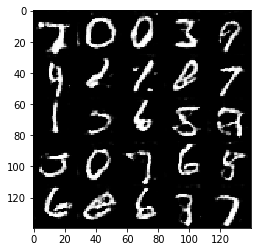

Epoch 2/2... Discriminator Loss: 0.4434... Generator Loss: 2.4591
Epoch 2/2... Discriminator Loss: 0.6914... Generator Loss: 1.5414
Epoch 2/2... Discriminator Loss: 0.6771... Generator Loss: 1.4812
Epoch 2/2... Discriminator Loss: 0.7169... Generator Loss: 1.3696
Epoch 2/2... Discriminator Loss: 0.6630... Generator Loss: 1.6807
Epoch 2/2... Discriminator Loss: 1.5567... Generator Loss: 0.5012
Epoch 2/2... Discriminator Loss: 0.6282... Generator Loss: 1.5067
Epoch 2/2... Discriminator Loss: 0.6724... Generator Loss: 1.6628
Epoch 2/2... Discriminator Loss: 1.0417... Generator Loss: 0.7651
Epoch 2/2... Discriminator Loss: 0.5611... Generator Loss: 1.8949


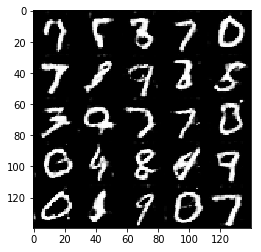

Epoch 2/2... Discriminator Loss: 0.6530... Generator Loss: 1.5445
Epoch 2/2... Discriminator Loss: 0.5445... Generator Loss: 2.1250
Epoch 2/2... Discriminator Loss: 0.5798... Generator Loss: 1.8427
Epoch 2/2... Discriminator Loss: 1.1232... Generator Loss: 2.4799
Epoch 2/2... Discriminator Loss: 0.8488... Generator Loss: 1.9609
Epoch 2/2... Discriminator Loss: 0.6093... Generator Loss: 1.9497
Epoch 2/2... Discriminator Loss: 0.9385... Generator Loss: 0.9982
Epoch 2/2... Discriminator Loss: 0.9161... Generator Loss: 1.0254
Epoch 2/2... Discriminator Loss: 0.7700... Generator Loss: 1.3311
Epoch 2/2... Discriminator Loss: 0.5241... Generator Loss: 2.2592


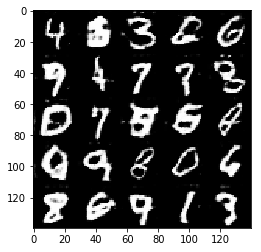

Epoch 2/2... Discriminator Loss: 0.5588... Generator Loss: 1.8883
Epoch 2/2... Discriminator Loss: 0.5577... Generator Loss: 1.8244
Epoch 2/2... Discriminator Loss: 1.2522... Generator Loss: 2.8584
Epoch 2/2... Discriminator Loss: 1.2424... Generator Loss: 0.6540
Epoch 2/2... Discriminator Loss: 0.6366... Generator Loss: 1.5639
Epoch 2/2... Discriminator Loss: 0.4544... Generator Loss: 2.3095
Epoch 2/2... Discriminator Loss: 1.8417... Generator Loss: 5.9295
Epoch 2/2... Discriminator Loss: 0.6254... Generator Loss: 1.8010
Epoch 2/2... Discriminator Loss: 0.5919... Generator Loss: 1.7382
Epoch 2/2... Discriminator Loss: 0.7061... Generator Loss: 2.1320


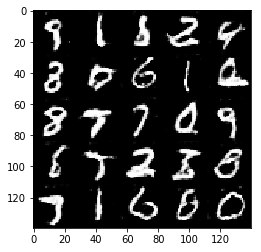

Epoch 2/2... Discriminator Loss: 0.6014... Generator Loss: 1.6515
Epoch 2/2... Discriminator Loss: 0.6003... Generator Loss: 1.5388
Epoch 2/2... Discriminator Loss: 0.7546... Generator Loss: 1.2205
Epoch 2/2... Discriminator Loss: 0.6320... Generator Loss: 1.6531
Epoch 2/2... Discriminator Loss: 0.8502... Generator Loss: 1.1488
Epoch 2/2... Discriminator Loss: 0.5791... Generator Loss: 1.7569
Epoch 2/2... Discriminator Loss: 0.8136... Generator Loss: 1.2304
Epoch 2/2... Discriminator Loss: 1.0264... Generator Loss: 0.8150
Epoch 2/2... Discriminator Loss: 0.6964... Generator Loss: 1.4160
Epoch 2/2... Discriminator Loss: 1.1509... Generator Loss: 0.9188


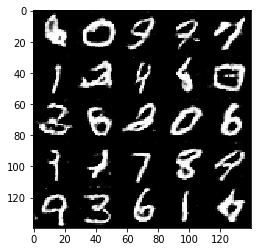

Epoch 2/2... Discriminator Loss: 1.2721... Generator Loss: 0.6556
Epoch 2/2... Discriminator Loss: 0.5611... Generator Loss: 1.7967
Epoch 2/2... Discriminator Loss: 0.6589... Generator Loss: 1.3882
Epoch 2/2... Discriminator Loss: 0.6390... Generator Loss: 1.4358
Epoch 2/2... Discriminator Loss: 0.5040... Generator Loss: 2.8176
Epoch 2/2... Discriminator Loss: 0.6697... Generator Loss: 1.4410
Epoch 2/2... Discriminator Loss: 0.6048... Generator Loss: 1.6877
Epoch 2/2... Discriminator Loss: 0.9236... Generator Loss: 0.9274
Epoch 2/2... Discriminator Loss: 0.6034... Generator Loss: 2.1159
Epoch 2/2... Discriminator Loss: 0.6582... Generator Loss: 1.7880


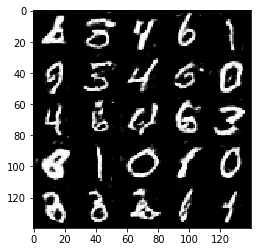

Epoch 2/2... Discriminator Loss: 1.3868... Generator Loss: 0.6037
Epoch 2/2... Discriminator Loss: 0.9983... Generator Loss: 0.9621
Epoch 2/2... Discriminator Loss: 0.7333... Generator Loss: 1.2601
Epoch 2/2... Discriminator Loss: 0.5008... Generator Loss: 2.0718
Epoch 2/2... Discriminator Loss: 0.6527... Generator Loss: 1.5437
Epoch 2/2... Discriminator Loss: 0.7735... Generator Loss: 1.2142
Epoch 2/2... Discriminator Loss: 0.5169... Generator Loss: 1.9132
Epoch 2/2... Discriminator Loss: 0.4849... Generator Loss: 2.2515
Epoch 2/2... Discriminator Loss: 0.5698... Generator Loss: 1.7663
Epoch 2/2... Discriminator Loss: 0.6883... Generator Loss: 1.3171


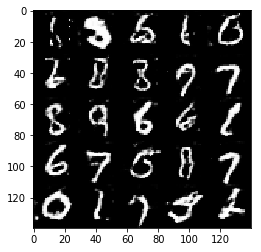

Epoch 2/2... Discriminator Loss: 0.4599... Generator Loss: 2.3055
Epoch 2/2... Discriminator Loss: 0.5681... Generator Loss: 1.8410
Epoch 2/2... Discriminator Loss: 1.4066... Generator Loss: 0.5614
Epoch 2/2... Discriminator Loss: 0.6069... Generator Loss: 3.2550
Epoch 2/2... Discriminator Loss: 0.6767... Generator Loss: 1.4132
Epoch 2/2... Discriminator Loss: 1.1260... Generator Loss: 0.7888
Epoch 2/2... Discriminator Loss: 0.6782... Generator Loss: 1.8275
Epoch 2/2... Discriminator Loss: 0.6636... Generator Loss: 1.5065
Epoch 2/2... Discriminator Loss: 0.6936... Generator Loss: 1.2851
Epoch 2/2... Discriminator Loss: 1.4641... Generator Loss: 0.5904


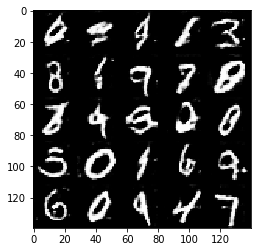

Epoch 2/2... Discriminator Loss: 0.5332... Generator Loss: 1.9160
Epoch 2/2... Discriminator Loss: 0.7285... Generator Loss: 1.2722
Epoch 2/2... Discriminator Loss: 1.1371... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 0.5792... Generator Loss: 2.9570
Epoch 2/2... Discriminator Loss: 0.6036... Generator Loss: 2.3034
Epoch 2/2... Discriminator Loss: 0.8029... Generator Loss: 1.4358
Epoch 2/2... Discriminator Loss: 0.8120... Generator Loss: 1.0932
Epoch 2/2... Discriminator Loss: 0.5469... Generator Loss: 1.8865
Epoch 2/2... Discriminator Loss: 0.5479... Generator Loss: 2.0266
Epoch 2/2... Discriminator Loss: 1.7043... Generator Loss: 0.3539


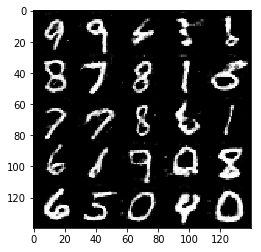

Epoch 2/2... Discriminator Loss: 0.4971... Generator Loss: 2.0508
Epoch 2/2... Discriminator Loss: 0.5382... Generator Loss: 2.4540
Epoch 2/2... Discriminator Loss: 0.8525... Generator Loss: 2.9431
Epoch 2/2... Discriminator Loss: 1.1850... Generator Loss: 0.6767
Epoch 2/2... Discriminator Loss: 1.0220... Generator Loss: 0.9856
Epoch 2/2... Discriminator Loss: 1.0398... Generator Loss: 0.8368
Epoch 2/2... Discriminator Loss: 0.8178... Generator Loss: 1.1845
Epoch 2/2... Discriminator Loss: 0.5065... Generator Loss: 2.0532
Epoch 2/2... Discriminator Loss: 0.6712... Generator Loss: 1.4505
Epoch 2/2... Discriminator Loss: 0.5923... Generator Loss: 1.7908


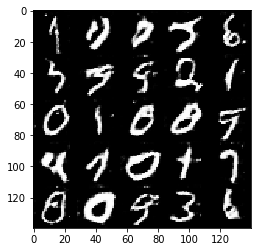

Epoch 2/2... Discriminator Loss: 0.7086... Generator Loss: 1.3987
Epoch 2/2... Discriminator Loss: 0.6933... Generator Loss: 2.3895
Epoch 2/2... Discriminator Loss: 0.4147... Generator Loss: 3.2041
Epoch 2/2... Discriminator Loss: 0.5922... Generator Loss: 1.7187
Epoch 2/2... Discriminator Loss: 0.6378... Generator Loss: 1.5084
Epoch 2/2... Discriminator Loss: 1.2806... Generator Loss: 0.5995
Epoch 2/2... Discriminator Loss: 0.5492... Generator Loss: 2.7875
Epoch 2/2... Discriminator Loss: 0.7776... Generator Loss: 1.1691
Epoch 2/2... Discriminator Loss: 0.6930... Generator Loss: 1.3391
Epoch 2/2... Discriminator Loss: 0.7182... Generator Loss: 1.3323


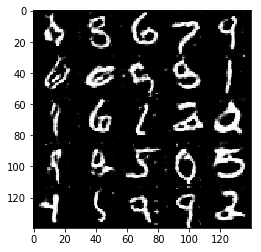

Epoch 2/2... Discriminator Loss: 0.6837... Generator Loss: 1.5384
Epoch 2/2... Discriminator Loss: 0.5421... Generator Loss: 1.8603
Epoch 2/2... Discriminator Loss: 0.5526... Generator Loss: 1.9349
Epoch 2/2... Discriminator Loss: 1.0276... Generator Loss: 0.8849
Epoch 2/2... Discriminator Loss: 0.7077... Generator Loss: 1.7504
Epoch 2/2... Discriminator Loss: 0.5072... Generator Loss: 2.0607
Epoch 2/2... Discriminator Loss: 1.0155... Generator Loss: 0.8262
Epoch 2/2... Discriminator Loss: 0.8445... Generator Loss: 1.0269
Epoch 2/2... Discriminator Loss: 1.8148... Generator Loss: 0.3813
Epoch 2/2... Discriminator Loss: 0.8280... Generator Loss: 1.1089


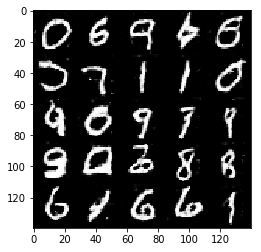

Epoch 2/2... Discriminator Loss: 0.5068... Generator Loss: 1.9592
Epoch 2/2... Discriminator Loss: 0.7707... Generator Loss: 1.1031
Epoch 2/2... Discriminator Loss: 0.7115... Generator Loss: 1.2421
Epoch 2/2... Discriminator Loss: 0.7929... Generator Loss: 2.9909
Epoch 2/2... Discriminator Loss: 0.4740... Generator Loss: 3.0631
Epoch 2/2... Discriminator Loss: 0.6194... Generator Loss: 1.4717
Epoch 2/2... Discriminator Loss: 1.3285... Generator Loss: 0.8076
Epoch 2/2... Discriminator Loss: 1.2227... Generator Loss: 0.9396
Epoch 2/2... Discriminator Loss: 1.1855... Generator Loss: 0.7758
Epoch 2/2... Discriminator Loss: 0.5275... Generator Loss: 2.4536


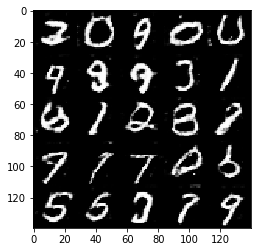

Epoch 2/2... Discriminator Loss: 0.7749... Generator Loss: 1.1894
Epoch 2/2... Discriminator Loss: 0.7601... Generator Loss: 1.3399
Epoch 2/2... Discriminator Loss: 0.6788... Generator Loss: 1.5197
Epoch 2/2... Discriminator Loss: 0.5426... Generator Loss: 2.0315
Epoch 2/2... Discriminator Loss: 0.6956... Generator Loss: 1.4761
Epoch 2/2... Discriminator Loss: 0.6038... Generator Loss: 1.6498
Epoch 2/2... Discriminator Loss: 1.2413... Generator Loss: 0.6665
Epoch 2/2... Discriminator Loss: 0.5994... Generator Loss: 1.7918
Epoch 2/2... Discriminator Loss: 0.9931... Generator Loss: 0.9845
Epoch 2/2... Discriminator Loss: 0.5958... Generator Loss: 1.6194


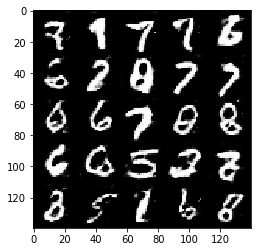

Epoch 2/2... Discriminator Loss: 0.6418... Generator Loss: 1.4080
Epoch 2/2... Discriminator Loss: 0.6550... Generator Loss: 1.4686
Epoch 2/2... Discriminator Loss: 0.4835... Generator Loss: 2.3351
Epoch 2/2... Discriminator Loss: 0.7817... Generator Loss: 1.1063
Epoch 2/2... Discriminator Loss: 0.6719... Generator Loss: 1.3774
Epoch 2/2... Discriminator Loss: 0.4802... Generator Loss: 2.1663
Epoch 2/2... Discriminator Loss: 0.9548... Generator Loss: 0.9271
Epoch 2/2... Discriminator Loss: 0.6857... Generator Loss: 1.5860
Epoch 2/2... Discriminator Loss: 0.5787... Generator Loss: 1.7778
Epoch 2/2... Discriminator Loss: 1.4394... Generator Loss: 0.6232


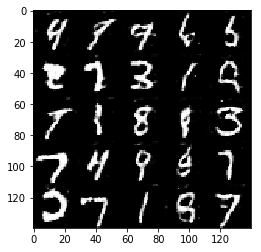

Epoch 2/2... Discriminator Loss: 0.6105... Generator Loss: 1.5635
Epoch 2/2... Discriminator Loss: 0.5471... Generator Loss: 1.8602
Epoch 2/2... Discriminator Loss: 0.4417... Generator Loss: 2.4474
Epoch 2/2... Discriminator Loss: 0.6711... Generator Loss: 1.4842
Epoch 2/2... Discriminator Loss: 0.6698... Generator Loss: 1.3815
Epoch 2/2... Discriminator Loss: 0.7004... Generator Loss: 1.4915
Epoch 2/2... Discriminator Loss: 0.8538... Generator Loss: 1.0418
Epoch 2/2... Discriminator Loss: 0.6810... Generator Loss: 1.4450
Epoch 2/2... Discriminator Loss: 1.0344... Generator Loss: 0.8425
Epoch 2/2... Discriminator Loss: 0.7723... Generator Loss: 1.3088


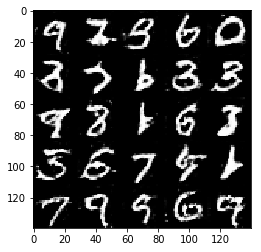

Epoch 2/2... Discriminator Loss: 0.8343... Generator Loss: 1.1657
Epoch 2/2... Discriminator Loss: 0.6598... Generator Loss: 1.4149
Epoch 2/2... Discriminator Loss: 0.5523... Generator Loss: 1.7915
Epoch 2/2... Discriminator Loss: 0.6522... Generator Loss: 1.4508
Epoch 2/2... Discriminator Loss: 0.8115... Generator Loss: 1.4322
Epoch 2/2... Discriminator Loss: 0.7488... Generator Loss: 1.2261
Epoch 2/2... Discriminator Loss: 0.6798... Generator Loss: 1.3839
Epoch 2/2... Discriminator Loss: 1.3482... Generator Loss: 0.5983
Epoch 2/2... Discriminator Loss: 0.5359... Generator Loss: 1.9087
Epoch 2/2... Discriminator Loss: 2.1173... Generator Loss: 0.2999


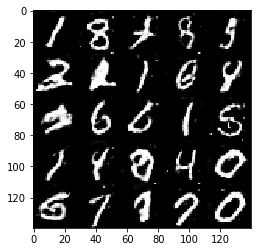

Epoch 2/2... Discriminator Loss: 1.2085... Generator Loss: 3.3552
Epoch 2/2... Discriminator Loss: 1.3611... Generator Loss: 0.6139
Epoch 2/2... Discriminator Loss: 0.8730... Generator Loss: 1.0819
Epoch 2/2... Discriminator Loss: 0.9071... Generator Loss: 0.9555
Epoch 2/2... Discriminator Loss: 0.6698... Generator Loss: 1.3975
Epoch 2/2... Discriminator Loss: 0.8431... Generator Loss: 1.0617
Epoch 2/2... Discriminator Loss: 0.6612... Generator Loss: 1.4213
Epoch 2/2... Discriminator Loss: 0.5794... Generator Loss: 1.6940
Epoch 2/2... Discriminator Loss: 0.6059... Generator Loss: 1.5344
Epoch 2/2... Discriminator Loss: 0.6909... Generator Loss: 1.5118


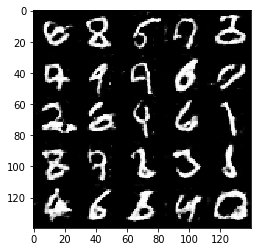

Epoch 2/2... Discriminator Loss: 0.4852... Generator Loss: 2.3357
Epoch 2/2... Discriminator Loss: 0.5411... Generator Loss: 1.8854
Epoch 2/2... Discriminator Loss: 0.4820... Generator Loss: 2.4090
Epoch 2/2... Discriminator Loss: 0.7338... Generator Loss: 1.3333
Epoch 2/2... Discriminator Loss: 0.9610... Generator Loss: 4.1808
Epoch 2/2... Discriminator Loss: 0.9573... Generator Loss: 0.9575
Epoch 2/2... Discriminator Loss: 0.7431... Generator Loss: 1.3326
Epoch 2/2... Discriminator Loss: 0.9626... Generator Loss: 0.9597
Epoch 2/2... Discriminator Loss: 0.4938... Generator Loss: 2.1562
Epoch 2/2... Discriminator Loss: 1.2894... Generator Loss: 0.6447


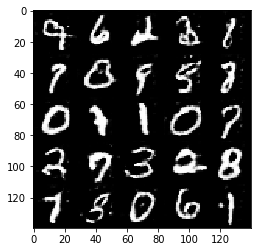

Epoch 2/2... Discriminator Loss: 0.7952... Generator Loss: 1.5969
Epoch 2/2... Discriminator Loss: 3.2189... Generator Loss: 0.2787
Epoch 2/2... Discriminator Loss: 0.7498... Generator Loss: 1.2030
Epoch 2/2... Discriminator Loss: 0.7163... Generator Loss: 1.3598
Epoch 2/2... Discriminator Loss: 0.5886... Generator Loss: 1.7309
Epoch 2/2... Discriminator Loss: 0.6249... Generator Loss: 1.5210
Epoch 2/2... Discriminator Loss: 0.6397... Generator Loss: 1.6553
Epoch 2/2... Discriminator Loss: 0.7912... Generator Loss: 1.1597
Epoch 2/2... Discriminator Loss: 0.6892... Generator Loss: 1.4584
Epoch 2/2... Discriminator Loss: 0.4343... Generator Loss: 2.7933


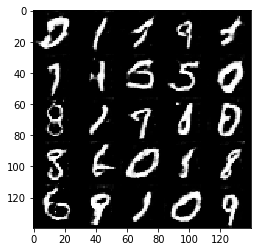

Epoch 2/2... Discriminator Loss: 1.3917... Generator Loss: 0.6750
Epoch 2/2... Discriminator Loss: 0.5691... Generator Loss: 1.8762
Epoch 2/2... Discriminator Loss: 0.6979... Generator Loss: 1.3100
Epoch 2/2... Discriminator Loss: 0.8077... Generator Loss: 1.2797
Epoch 2/2... Discriminator Loss: 0.6912... Generator Loss: 1.4431
Epoch 2/2... Discriminator Loss: 0.5872... Generator Loss: 1.8322
Epoch 2/2... Discriminator Loss: 0.5112... Generator Loss: 2.1604
Epoch 2/2... Discriminator Loss: 0.5475... Generator Loss: 1.9106
Epoch 2/2... Discriminator Loss: 0.5275... Generator Loss: 2.1478
Epoch 2/2... Discriminator Loss: 0.5617... Generator Loss: 1.8620


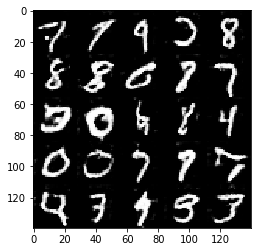

Epoch 2/2... Discriminator Loss: 0.5492... Generator Loss: 1.9457
Epoch 2/2... Discriminator Loss: 0.7654... Generator Loss: 1.2091
Epoch 2/2... Discriminator Loss: 0.6061... Generator Loss: 1.6683
Epoch 2/2... Discriminator Loss: 0.6314... Generator Loss: 1.5739
Epoch 2/2... Discriminator Loss: 1.1535... Generator Loss: 0.7421
Epoch 2/2... Discriminator Loss: 0.5847... Generator Loss: 1.7828
Epoch 2/2... Discriminator Loss: 0.4901... Generator Loss: 2.2764
Epoch 2/2... Discriminator Loss: 0.5276... Generator Loss: 2.0431
Epoch 2/2... Discriminator Loss: 0.7765... Generator Loss: 1.1581
Epoch 2/2... Discriminator Loss: 0.6674... Generator Loss: 1.5854


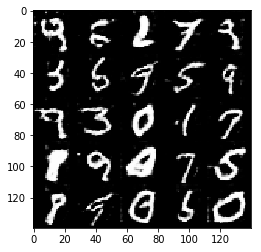

Epoch 2/2... Discriminator Loss: 0.6376... Generator Loss: 1.6392
Epoch 2/2... Discriminator Loss: 1.2435... Generator Loss: 1.0023
Epoch 2/2... Discriminator Loss: 0.5798... Generator Loss: 3.1653
Epoch 2/2... Discriminator Loss: 0.8098... Generator Loss: 3.1374
Epoch 2/2... Discriminator Loss: 0.9240... Generator Loss: 1.0201
Epoch 2/2... Discriminator Loss: 0.6204... Generator Loss: 1.5875
Epoch 2/2... Discriminator Loss: 2.0089... Generator Loss: 0.2893
Epoch 2/2... Discriminator Loss: 0.6395... Generator Loss: 1.4881
Epoch 2/2... Discriminator Loss: 0.7732... Generator Loss: 1.2090
Epoch 2/2... Discriminator Loss: 0.7319... Generator Loss: 1.4889


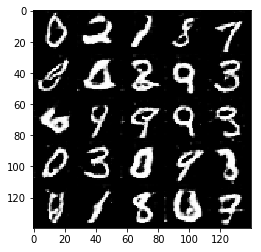

Epoch 2/2... Discriminator Loss: 0.6252... Generator Loss: 1.6543
Epoch 2/2... Discriminator Loss: 0.4940... Generator Loss: 2.2338
Epoch 2/2... Discriminator Loss: 1.0376... Generator Loss: 0.9068
Epoch 2/2... Discriminator Loss: 0.4864... Generator Loss: 2.2438
Epoch 2/2... Discriminator Loss: 0.5550... Generator Loss: 1.9976
Epoch 2/2... Discriminator Loss: 0.5372... Generator Loss: 2.8343
Epoch 2/2... Discriminator Loss: 0.7765... Generator Loss: 1.1426
Epoch 2/2... Discriminator Loss: 0.8685... Generator Loss: 1.0289
Epoch 2/2... Discriminator Loss: 0.6032... Generator Loss: 1.4946
Epoch 2/2... Discriminator Loss: 0.7063... Generator Loss: 1.2603


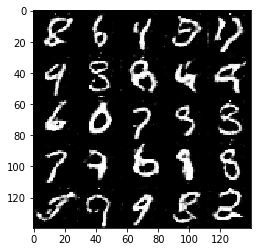

In [15]:
batch_size = 16
z_dim = 128
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.6038... Generator Loss: 0.0498
Epoch 1/1... Discriminator Loss: 0.8452... Generator Loss: 1.2513
Epoch 1/1... Discriminator Loss: 2.7514... Generator Loss: 0.1137
Epoch 1/1... Discriminator Loss: 0.7160... Generator Loss: 2.6804
Epoch 1/1... Discriminator Loss: 1.6826... Generator Loss: 9.2876
Epoch 1/1... Discriminator Loss: 0.9872... Generator Loss: 0.9197
Epoch 1/1... Discriminator Loss: 1.2202... Generator Loss: 5.3010
Epoch 1/1... Discriminator Loss: 1.0653... Generator Loss: 1.3826
Epoch 1/1... Discriminator Loss: 0.5354... Generator Loss: 2.7873
Epoch 1/1... Discriminator Loss: 0.8514... Generator Loss: 1.2355


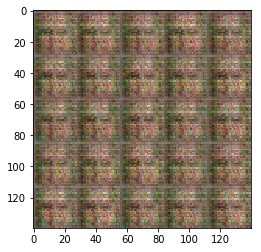

Epoch 1/1... Discriminator Loss: 0.5669... Generator Loss: 2.9244
Epoch 1/1... Discriminator Loss: 0.6420... Generator Loss: 1.7424
Epoch 1/1... Discriminator Loss: 1.0241... Generator Loss: 0.7623
Epoch 1/1... Discriminator Loss: 0.5458... Generator Loss: 2.2867
Epoch 1/1... Discriminator Loss: 0.3742... Generator Loss: 3.7763
Epoch 1/1... Discriminator Loss: 0.5432... Generator Loss: 2.3575
Epoch 1/1... Discriminator Loss: 0.4464... Generator Loss: 3.0226
Epoch 1/1... Discriminator Loss: 0.6418... Generator Loss: 1.5397
Epoch 1/1... Discriminator Loss: 0.4735... Generator Loss: 2.4963
Epoch 1/1... Discriminator Loss: 0.7109... Generator Loss: 1.8827


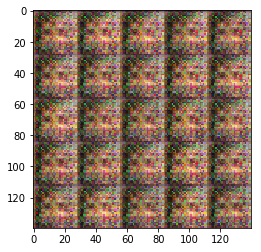

Epoch 1/1... Discriminator Loss: 0.6482... Generator Loss: 1.5558
Epoch 1/1... Discriminator Loss: 0.4581... Generator Loss: 4.0296
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.5162
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 3.8143
Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 4.2364
Epoch 1/1... Discriminator Loss: 1.1181... Generator Loss: 0.6445
Epoch 1/1... Discriminator Loss: 1.4679... Generator Loss: 0.5379
Epoch 1/1... Discriminator Loss: 1.1465... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 0.8817... Generator Loss: 2.2752
Epoch 1/1... Discriminator Loss: 1.1546... Generator Loss: 0.7864


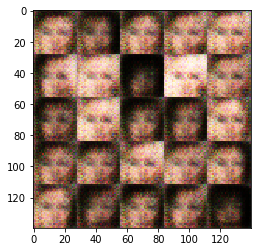

Epoch 1/1... Discriminator Loss: 0.8551... Generator Loss: 1.7315
Epoch 1/1... Discriminator Loss: 1.3709... Generator Loss: 0.6100
Epoch 1/1... Discriminator Loss: 1.2219... Generator Loss: 0.6636
Epoch 1/1... Discriminator Loss: 0.9791... Generator Loss: 0.9197
Epoch 1/1... Discriminator Loss: 1.0509... Generator Loss: 1.7148
Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.2641... Generator Loss: 0.9701
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.4693
Epoch 1/1... Discriminator Loss: 1.3623... Generator Loss: 0.9408
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.9983


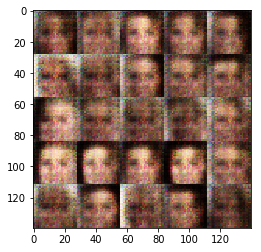

Epoch 1/1... Discriminator Loss: 1.0038... Generator Loss: 1.0862
Epoch 1/1... Discriminator Loss: 1.0702... Generator Loss: 0.9290
Epoch 1/1... Discriminator Loss: 1.1516... Generator Loss: 0.9043
Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.0788... Generator Loss: 1.8678
Epoch 1/1... Discriminator Loss: 0.9758... Generator Loss: 1.0075
Epoch 1/1... Discriminator Loss: 1.0707... Generator Loss: 0.9439
Epoch 1/1... Discriminator Loss: 1.3080... Generator Loss: 0.9983
Epoch 1/1... Discriminator Loss: 1.1250... Generator Loss: 1.0534
Epoch 1/1... Discriminator Loss: 1.5123... Generator Loss: 0.4506


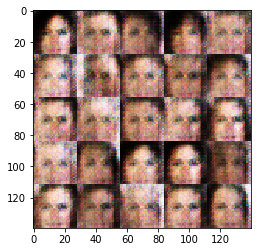

Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 1.4776
Epoch 1/1... Discriminator Loss: 1.1311... Generator Loss: 0.7824
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 0.7164
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 1.3649
Epoch 1/1... Discriminator Loss: 1.1714... Generator Loss: 1.2283
Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.6758
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.5881
Epoch 1/1... Discriminator Loss: 0.9595... Generator Loss: 0.9768


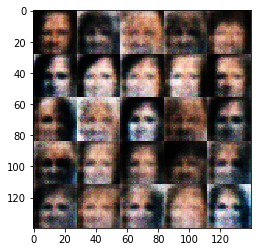

Epoch 1/1... Discriminator Loss: 1.0313... Generator Loss: 0.8566
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 0.8013
Epoch 1/1... Discriminator Loss: 0.9400... Generator Loss: 1.2811
Epoch 1/1... Discriminator Loss: 1.0014... Generator Loss: 1.0191
Epoch 1/1... Discriminator Loss: 1.3857... Generator Loss: 0.5126
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.6148
Epoch 1/1... Discriminator Loss: 1.2774... Generator Loss: 1.3715
Epoch 1/1... Discriminator Loss: 1.2274... Generator Loss: 1.1100
Epoch 1/1... Discriminator Loss: 1.4770... Generator Loss: 0.6429


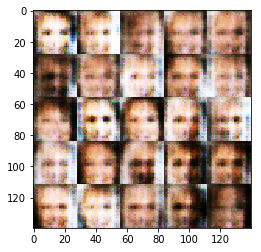

Epoch 1/1... Discriminator Loss: 1.4389... Generator Loss: 0.6221
Epoch 1/1... Discriminator Loss: 1.3302... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 1.2061... Generator Loss: 0.6442
Epoch 1/1... Discriminator Loss: 1.4593... Generator Loss: 0.5829
Epoch 1/1... Discriminator Loss: 1.2800... Generator Loss: 0.8874
Epoch 1/1... Discriminator Loss: 1.0513... Generator Loss: 0.8548
Epoch 1/1... Discriminator Loss: 1.0222... Generator Loss: 0.9775
Epoch 1/1... Discriminator Loss: 1.2556... Generator Loss: 0.6959
Epoch 1/1... Discriminator Loss: 1.1855... Generator Loss: 0.7504
Epoch 1/1... Discriminator Loss: 1.3964... Generator Loss: 1.0676


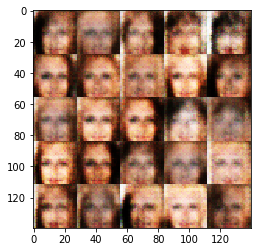

Epoch 1/1... Discriminator Loss: 1.2037... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 1.1753... Generator Loss: 1.0667
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.8395
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.5655
Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.7349
Epoch 1/1... Discriminator Loss: 1.1853... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.1084... Generator Loss: 1.0485
Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 2.1777
Epoch 1/1... Discriminator Loss: 1.1121... Generator Loss: 1.1138


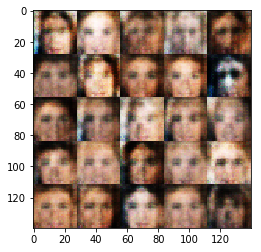

Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.8195
Epoch 1/1... Discriminator Loss: 1.1667... Generator Loss: 0.9785
Epoch 1/1... Discriminator Loss: 1.3043... Generator Loss: 1.0896
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.7178
Epoch 1/1... Discriminator Loss: 1.0092... Generator Loss: 1.1629
Epoch 1/1... Discriminator Loss: 1.3512... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 1.0548
Epoch 1/1... Discriminator Loss: 1.5116... Generator Loss: 0.5515
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.1676... Generator Loss: 0.7756


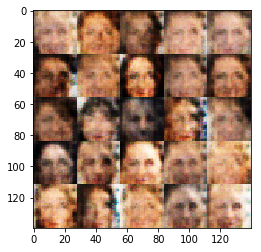

Epoch 1/1... Discriminator Loss: 1.4290... Generator Loss: 0.4921
Epoch 1/1... Discriminator Loss: 1.1134... Generator Loss: 1.1402
Epoch 1/1... Discriminator Loss: 1.1638... Generator Loss: 0.7545
Epoch 1/1... Discriminator Loss: 1.2015... Generator Loss: 0.8286
Epoch 1/1... Discriminator Loss: 1.4949... Generator Loss: 0.4570
Epoch 1/1... Discriminator Loss: 1.3896... Generator Loss: 0.6342
Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 0.5843
Epoch 1/1... Discriminator Loss: 1.1193... Generator Loss: 1.2379
Epoch 1/1... Discriminator Loss: 1.3235... Generator Loss: 1.0163
Epoch 1/1... Discriminator Loss: 1.0842... Generator Loss: 0.9779


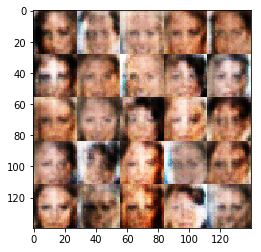

Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 1.2857... Generator Loss: 1.0955
Epoch 1/1... Discriminator Loss: 1.3066... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.6932... Generator Loss: 0.3531
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.5866
Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 1.0957
Epoch 1/1... Discriminator Loss: 1.0399... Generator Loss: 1.0688
Epoch 1/1... Discriminator Loss: 1.1333... Generator Loss: 0.9427
Epoch 1/1... Discriminator Loss: 1.3598... Generator Loss: 0.6044
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.8164


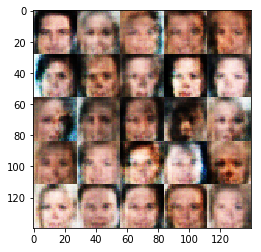

Epoch 1/1... Discriminator Loss: 1.1038... Generator Loss: 0.8950
Epoch 1/1... Discriminator Loss: 1.1455... Generator Loss: 1.0283
Epoch 1/1... Discriminator Loss: 1.5351... Generator Loss: 1.2442
Epoch 1/1... Discriminator Loss: 1.0831... Generator Loss: 0.8090
Epoch 1/1... Discriminator Loss: 1.2443... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.9594
Epoch 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.6608
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.6180
Epoch 1/1... Discriminator Loss: 1.2063... Generator Loss: 0.7070
Epoch 1/1... Discriminator Loss: 1.5097... Generator Loss: 0.4526


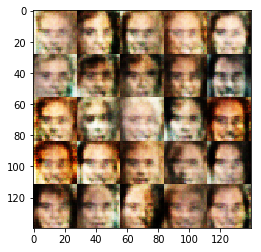

Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.8361
Epoch 1/1... Discriminator Loss: 1.2291... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.8661
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.8205
Epoch 1/1... Discriminator Loss: 1.1597... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 1.1589... Generator Loss: 1.0186
Epoch 1/1... Discriminator Loss: 1.1091... Generator Loss: 0.8244
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.8432
Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.4951
Epoch 1/1... Discriminator Loss: 1.2589... Generator Loss: 0.6311


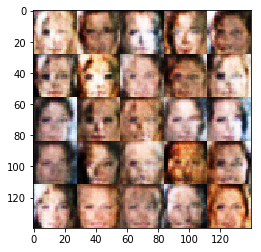

Epoch 1/1... Discriminator Loss: 1.1525... Generator Loss: 0.9898
Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 1.2552
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 1.2854
Epoch 1/1... Discriminator Loss: 1.1331... Generator Loss: 1.1543
Epoch 1/1... Discriminator Loss: 1.1562... Generator Loss: 0.9130
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 0.4777
Epoch 1/1... Discriminator Loss: 1.3086... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 0.8719
Epoch 1/1... Discriminator Loss: 1.2347... Generator Loss: 0.9163
Epoch 1/1... Discriminator Loss: 1.6639... Generator Loss: 0.4161


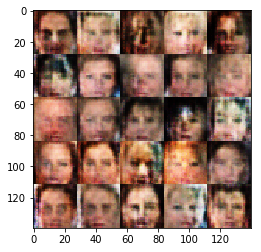

Epoch 1/1... Discriminator Loss: 1.5931... Generator Loss: 0.3826
Epoch 1/1... Discriminator Loss: 1.1801... Generator Loss: 0.8343
Epoch 1/1... Discriminator Loss: 1.4482... Generator Loss: 0.8754
Epoch 1/1... Discriminator Loss: 1.2424... Generator Loss: 0.8334
Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.1853... Generator Loss: 0.8046
Epoch 1/1... Discriminator Loss: 1.1995... Generator Loss: 0.7236
Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.7405
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 0.8838
Epoch 1/1... Discriminator Loss: 1.5485... Generator Loss: 0.6065


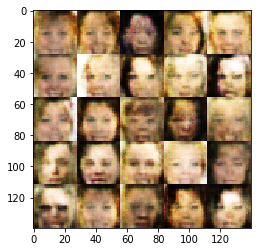

Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.5627
Epoch 1/1... Discriminator Loss: 1.1770... Generator Loss: 0.9308
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.4627
Epoch 1/1... Discriminator Loss: 1.2195... Generator Loss: 0.8368
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 0.9590
Epoch 1/1... Discriminator Loss: 1.1650... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.1008... Generator Loss: 1.2007
Epoch 1/1... Discriminator Loss: 1.2247... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.5280
Epoch 1/1... Discriminator Loss: 1.1277... Generator Loss: 0.7282


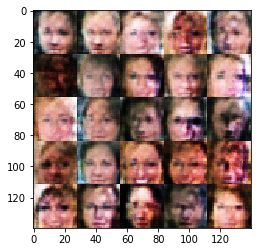

Epoch 1/1... Discriminator Loss: 1.1904... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 1.1219
Epoch 1/1... Discriminator Loss: 1.4484... Generator Loss: 1.1698
Epoch 1/1... Discriminator Loss: 1.4976... Generator Loss: 0.4897
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 1.0917
Epoch 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.7437
Epoch 1/1... Discriminator Loss: 1.2971... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 1.1455... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.4139... Generator Loss: 0.4745
Epoch 1/1... Discriminator Loss: 1.2001... Generator Loss: 0.6650


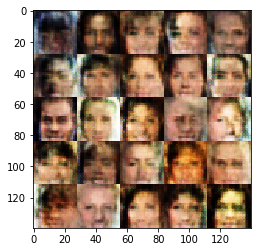

Epoch 1/1... Discriminator Loss: 1.0459... Generator Loss: 0.9796
Epoch 1/1... Discriminator Loss: 1.0614... Generator Loss: 0.8078
Epoch 1/1... Discriminator Loss: 1.3279... Generator Loss: 0.6341
Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 1.1701
Epoch 1/1... Discriminator Loss: 1.2325... Generator Loss: 1.0864
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 1.6381
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.6112
Epoch 1/1... Discriminator Loss: 1.1679... Generator Loss: 0.8707
Epoch 1/1... Discriminator Loss: 1.1873... Generator Loss: 0.8925
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 1.2723


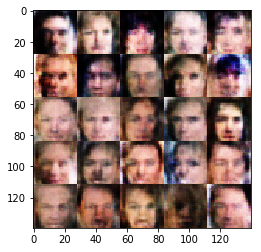

Epoch 1/1... Discriminator Loss: 1.2272... Generator Loss: 1.0037
Epoch 1/1... Discriminator Loss: 1.1122... Generator Loss: 1.0828
Epoch 1/1... Discriminator Loss: 1.2632... Generator Loss: 1.1996
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 1.3424
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.7504
Epoch 1/1... Discriminator Loss: 1.3294... Generator Loss: 0.7946
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.6229
Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 0.6374
Epoch 1/1... Discriminator Loss: 1.3551... Generator Loss: 0.6734
Epoch 1/1... Discriminator Loss: 1.7454... Generator Loss: 0.3876


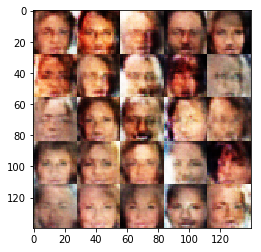

Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.8109
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.6814
Epoch 1/1... Discriminator Loss: 1.1389... Generator Loss: 1.0594
Epoch 1/1... Discriminator Loss: 1.6798... Generator Loss: 0.3865
Epoch 1/1... Discriminator Loss: 1.4496... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 1.0617... Generator Loss: 0.8987
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.6739
Epoch 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.5710
Epoch 1/1... Discriminator Loss: 1.0608... Generator Loss: 0.8700
Epoch 1/1... Discriminator Loss: 1.2994... Generator Loss: 0.8356


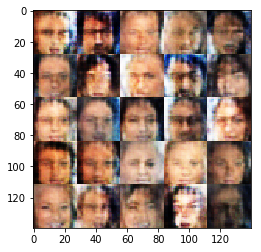

Epoch 1/1... Discriminator Loss: 1.0739... Generator Loss: 0.9080
Epoch 1/1... Discriminator Loss: 1.0156... Generator Loss: 1.0776
Epoch 1/1... Discriminator Loss: 1.1844... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.0751... Generator Loss: 0.8660
Epoch 1/1... Discriminator Loss: 1.0551... Generator Loss: 1.0111
Epoch 1/1... Discriminator Loss: 1.0868... Generator Loss: 0.8687
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.2706... Generator Loss: 1.2628
Epoch 1/1... Discriminator Loss: 1.0431... Generator Loss: 1.1208
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 0.9903


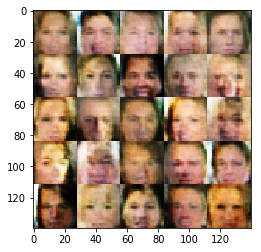

Epoch 1/1... Discriminator Loss: 1.0946... Generator Loss: 0.7849
Epoch 1/1... Discriminator Loss: 1.1374... Generator Loss: 1.1620
Epoch 1/1... Discriminator Loss: 1.1865... Generator Loss: 1.0676
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.5035
Epoch 1/1... Discriminator Loss: 1.2218... Generator Loss: 0.6466
Epoch 1/1... Discriminator Loss: 1.5587... Generator Loss: 0.4503
Epoch 1/1... Discriminator Loss: 1.1802... Generator Loss: 0.6256
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 0.8830
Epoch 1/1... Discriminator Loss: 1.5988... Generator Loss: 0.4227
Epoch 1/1... Discriminator Loss: 1.0106... Generator Loss: 1.1542


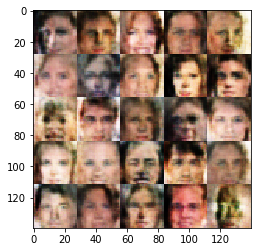

Epoch 1/1... Discriminator Loss: 1.2460... Generator Loss: 0.8399
Epoch 1/1... Discriminator Loss: 1.2746... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.0070... Generator Loss: 1.1203
Epoch 1/1... Discriminator Loss: 0.9405... Generator Loss: 1.2223
Epoch 1/1... Discriminator Loss: 1.1042... Generator Loss: 1.1927
Epoch 1/1... Discriminator Loss: 1.2401... Generator Loss: 0.9877
Epoch 1/1... Discriminator Loss: 0.9873... Generator Loss: 1.2503
Epoch 1/1... Discriminator Loss: 0.9980... Generator Loss: 0.9235
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 0.5798
Epoch 1/1... Discriminator Loss: 1.2055... Generator Loss: 0.6111


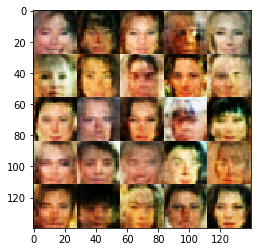

Epoch 1/1... Discriminator Loss: 1.1593... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 1.5094
Epoch 1/1... Discriminator Loss: 0.9972... Generator Loss: 1.0283
Epoch 1/1... Discriminator Loss: 1.1445... Generator Loss: 0.8296
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.5967
Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.8325
Epoch 1/1... Discriminator Loss: 1.2378... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.5615
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.6012
Epoch 1/1... Discriminator Loss: 1.4371... Generator Loss: 0.5471


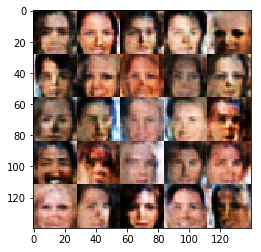

Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 0.9812
Epoch 1/1... Discriminator Loss: 1.3375... Generator Loss: 1.2838
Epoch 1/1... Discriminator Loss: 1.0754... Generator Loss: 1.2810
Epoch 1/1... Discriminator Loss: 1.1718... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.4895... Generator Loss: 0.4227
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.5558
Epoch 1/1... Discriminator Loss: 1.2178... Generator Loss: 0.7025
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 0.8512... Generator Loss: 1.5590
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.5209


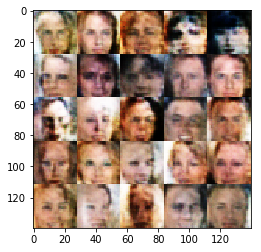

Epoch 1/1... Discriminator Loss: 1.1671... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.0579... Generator Loss: 0.9949
Epoch 1/1... Discriminator Loss: 1.1028... Generator Loss: 0.7975
Epoch 1/1... Discriminator Loss: 1.3168... Generator Loss: 0.5806
Epoch 1/1... Discriminator Loss: 1.2568... Generator Loss: 0.5829
Epoch 1/1... Discriminator Loss: 2.0431... Generator Loss: 0.2156
Epoch 1/1... Discriminator Loss: 1.0732... Generator Loss: 0.8479
Epoch 1/1... Discriminator Loss: 1.0446... Generator Loss: 1.6156
Epoch 1/1... Discriminator Loss: 1.7210... Generator Loss: 0.3161
Epoch 1/1... Discriminator Loss: 0.9359... Generator Loss: 0.9571


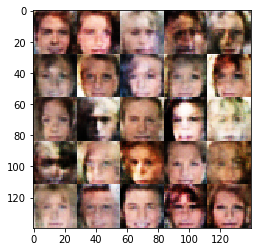

Epoch 1/1... Discriminator Loss: 1.2277... Generator Loss: 0.7199
Epoch 1/1... Discriminator Loss: 1.0821... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.0346... Generator Loss: 1.3022
Epoch 1/1... Discriminator Loss: 1.3101... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.8992... Generator Loss: 0.2587
Epoch 1/1... Discriminator Loss: 1.1033... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.5356... Generator Loss: 2.4540
Epoch 1/1... Discriminator Loss: 1.0619... Generator Loss: 0.8676
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 1.7569
Epoch 1/1... Discriminator Loss: 1.3171... Generator Loss: 1.4499


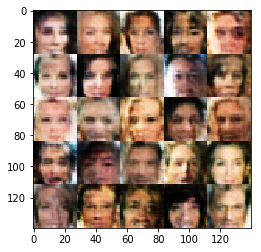

Epoch 1/1... Discriminator Loss: 1.1100... Generator Loss: 0.7636
Epoch 1/1... Discriminator Loss: 1.4032... Generator Loss: 0.4788
Epoch 1/1... Discriminator Loss: 0.9397... Generator Loss: 1.8228
Epoch 1/1... Discriminator Loss: 1.5239... Generator Loss: 0.4108
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.4869
Epoch 1/1... Discriminator Loss: 0.9324... Generator Loss: 1.0505
Epoch 1/1... Discriminator Loss: 1.2375... Generator Loss: 1.1938
Epoch 1/1... Discriminator Loss: 1.0255... Generator Loss: 0.9290
Epoch 1/1... Discriminator Loss: 1.0389... Generator Loss: 1.4042
Epoch 1/1... Discriminator Loss: 1.1475... Generator Loss: 1.3945


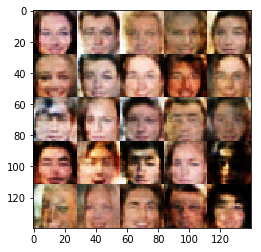

Epoch 1/1... Discriminator Loss: 1.5419... Generator Loss: 0.4217
Epoch 1/1... Discriminator Loss: 1.5145... Generator Loss: 0.5283
Epoch 1/1... Discriminator Loss: 0.8709... Generator Loss: 2.0560
Epoch 1/1... Discriminator Loss: 1.5318... Generator Loss: 0.4036
Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.6110
Epoch 1/1... Discriminator Loss: 1.4738... Generator Loss: 0.5009
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.6392
Epoch 1/1... Discriminator Loss: 0.9527... Generator Loss: 1.0516
Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 1.4032
Epoch 1/1... Discriminator Loss: 0.8639... Generator Loss: 1.2251


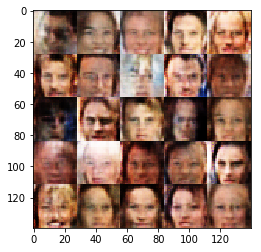

Epoch 1/1... Discriminator Loss: 1.5753... Generator Loss: 0.3954
Epoch 1/1... Discriminator Loss: 0.9207... Generator Loss: 0.9403
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 1.6388
Epoch 1/1... Discriminator Loss: 1.1662... Generator Loss: 0.6330
Epoch 1/1... Discriminator Loss: 1.0419... Generator Loss: 1.0562
Epoch 1/1... Discriminator Loss: 2.2527... Generator Loss: 0.1745
Epoch 1/1... Discriminator Loss: 1.0439... Generator Loss: 1.9539
Epoch 1/1... Discriminator Loss: 1.0080... Generator Loss: 1.0227
Epoch 1/1... Discriminator Loss: 1.0060... Generator Loss: 1.2509
Epoch 1/1... Discriminator Loss: 1.4908... Generator Loss: 0.7795


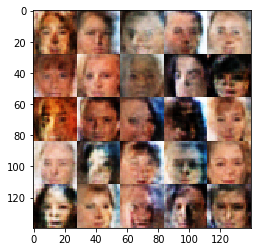

Epoch 1/1... Discriminator Loss: 1.1521... Generator Loss: 0.7086
Epoch 1/1... Discriminator Loss: 0.6327... Generator Loss: 1.6687
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.5684
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.5429
Epoch 1/1... Discriminator Loss: 1.3542... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.5601... Generator Loss: 0.3987
Epoch 1/1... Discriminator Loss: 1.6120... Generator Loss: 0.3647
Epoch 1/1... Discriminator Loss: 2.2008... Generator Loss: 0.1894
Epoch 1/1... Discriminator Loss: 1.2731... Generator Loss: 0.9105


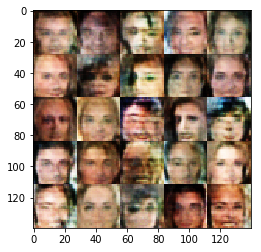

Epoch 1/1... Discriminator Loss: 0.9028... Generator Loss: 0.9494
Epoch 1/1... Discriminator Loss: 1.1002... Generator Loss: 0.9717
Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 1.2949
Epoch 1/1... Discriminator Loss: 0.8028... Generator Loss: 1.3435
Epoch 1/1... Discriminator Loss: 0.9586... Generator Loss: 1.1219
Epoch 1/1... Discriminator Loss: 1.6413... Generator Loss: 1.6723
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 0.9071
Epoch 1/1... Discriminator Loss: 0.9111... Generator Loss: 1.2101
Epoch 1/1... Discriminator Loss: 0.9843... Generator Loss: 1.2516
Epoch 1/1... Discriminator Loss: 0.8651... Generator Loss: 1.1269


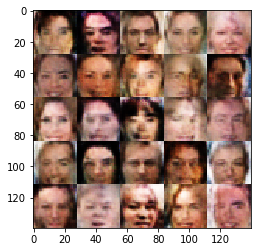

Epoch 1/1... Discriminator Loss: 1.1395... Generator Loss: 0.8786
Epoch 1/1... Discriminator Loss: 1.2005... Generator Loss: 0.7687
Epoch 1/1... Discriminator Loss: 1.0662... Generator Loss: 0.9192
Epoch 1/1... Discriminator Loss: 1.2280... Generator Loss: 1.1358
Epoch 1/1... Discriminator Loss: 1.4541... Generator Loss: 0.4398
Epoch 1/1... Discriminator Loss: 1.0220... Generator Loss: 1.3139
Epoch 1/1... Discriminator Loss: 1.5860... Generator Loss: 0.4165
Epoch 1/1... Discriminator Loss: 1.6545... Generator Loss: 0.3569
Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 0.4404
Epoch 1/1... Discriminator Loss: 2.0346... Generator Loss: 0.2200


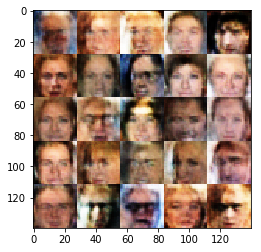

Epoch 1/1... Discriminator Loss: 0.8749... Generator Loss: 1.2305
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.5752
Epoch 1/1... Discriminator Loss: 0.9746... Generator Loss: 1.0888
Epoch 1/1... Discriminator Loss: 1.3897... Generator Loss: 1.2082
Epoch 1/1... Discriminator Loss: 1.0795... Generator Loss: 1.6627
Epoch 1/1... Discriminator Loss: 1.0713... Generator Loss: 1.2402
Epoch 1/1... Discriminator Loss: 1.0452... Generator Loss: 1.5207
Epoch 1/1... Discriminator Loss: 1.0830... Generator Loss: 1.3482
Epoch 1/1... Discriminator Loss: 0.8936... Generator Loss: 1.4535


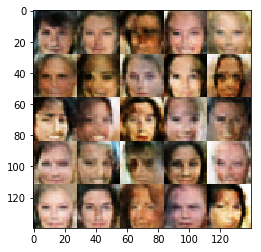

Epoch 1/1... Discriminator Loss: 1.1514... Generator Loss: 0.8131
Epoch 1/1... Discriminator Loss: 0.9514... Generator Loss: 1.0452
Epoch 1/1... Discriminator Loss: 0.7394... Generator Loss: 1.9694
Epoch 1/1... Discriminator Loss: 1.2530... Generator Loss: 0.6051
Epoch 1/1... Discriminator Loss: 1.1220... Generator Loss: 0.9318
Epoch 1/1... Discriminator Loss: 1.1223... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.2734... Generator Loss: 0.6047
Epoch 1/1... Discriminator Loss: 1.1035... Generator Loss: 0.9833
Epoch 1/1... Discriminator Loss: 1.1048... Generator Loss: 0.8825
Epoch 1/1... Discriminator Loss: 1.1017... Generator Loss: 0.6860


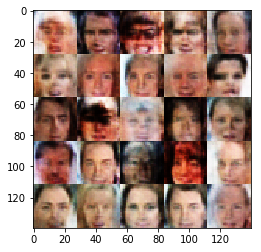

Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.4856
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 1.5037
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.6017
Epoch 1/1... Discriminator Loss: 1.0626... Generator Loss: 0.7606
Epoch 1/1... Discriminator Loss: 1.4207... Generator Loss: 0.4985
Epoch 1/1... Discriminator Loss: 1.0503... Generator Loss: 0.9595
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.4666
Epoch 1/1... Discriminator Loss: 0.9770... Generator Loss: 1.5419
Epoch 1/1... Discriminator Loss: 1.1262... Generator Loss: 0.6848


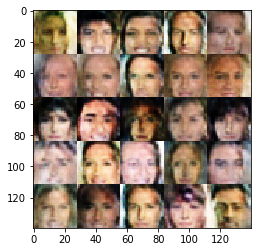

Epoch 1/1... Discriminator Loss: 0.9757... Generator Loss: 1.1566
Epoch 1/1... Discriminator Loss: 1.5631... Generator Loss: 0.3852
Epoch 1/1... Discriminator Loss: 0.9747... Generator Loss: 1.5606
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.4920
Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 1.0195
Epoch 1/1... Discriminator Loss: 1.8510... Generator Loss: 0.2737
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.5354
Epoch 1/1... Discriminator Loss: 1.4554... Generator Loss: 0.4692
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.1501... Generator Loss: 0.7718


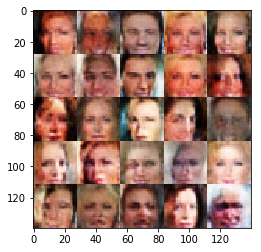

Epoch 1/1... Discriminator Loss: 1.0398... Generator Loss: 1.5219
Epoch 1/1... Discriminator Loss: 1.4346... Generator Loss: 0.4346
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.6301
Epoch 1/1... Discriminator Loss: 1.5337... Generator Loss: 0.3889
Epoch 1/1... Discriminator Loss: 1.2468... Generator Loss: 0.6586
Epoch 1/1... Discriminator Loss: 1.0030... Generator Loss: 1.2209
Epoch 1/1... Discriminator Loss: 1.1231... Generator Loss: 0.6661
Epoch 1/1... Discriminator Loss: 0.7404... Generator Loss: 1.3542
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.1838... Generator Loss: 0.9940


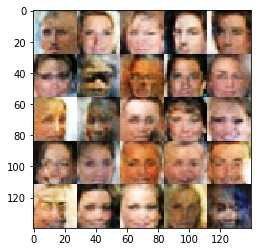

Epoch 1/1... Discriminator Loss: 0.8646... Generator Loss: 1.8328
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.8451
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 0.6549
Epoch 1/1... Discriminator Loss: 1.5577... Generator Loss: 0.3677
Epoch 1/1... Discriminator Loss: 0.8504... Generator Loss: 1.6180
Epoch 1/1... Discriminator Loss: 1.2458... Generator Loss: 0.6735
Epoch 1/1... Discriminator Loss: 0.9484... Generator Loss: 1.2184
Epoch 1/1... Discriminator Loss: 1.1368... Generator Loss: 0.9543
Epoch 1/1... Discriminator Loss: 1.1645... Generator Loss: 0.8346
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.6594


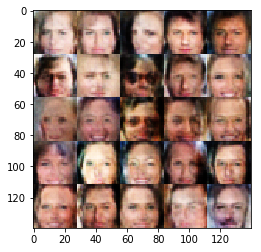

Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.5901
Epoch 1/1... Discriminator Loss: 0.8456... Generator Loss: 1.3908
Epoch 1/1... Discriminator Loss: 0.8060... Generator Loss: 1.2524
Epoch 1/1... Discriminator Loss: 0.9995... Generator Loss: 1.3501
Epoch 1/1... Discriminator Loss: 1.6802... Generator Loss: 0.3535
Epoch 1/1... Discriminator Loss: 0.9717... Generator Loss: 1.0131
Epoch 1/1... Discriminator Loss: 1.5737... Generator Loss: 0.3680
Epoch 1/1... Discriminator Loss: 1.2178... Generator Loss: 0.6019
Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 1.1203
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.6813


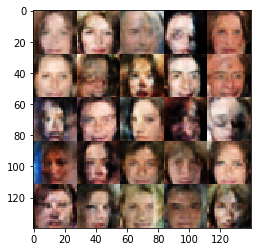

Epoch 1/1... Discriminator Loss: 1.1174... Generator Loss: 0.8836
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.4734
Epoch 1/1... Discriminator Loss: 1.1869... Generator Loss: 0.7990
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.6877
Epoch 1/1... Discriminator Loss: 1.5169... Generator Loss: 0.4197
Epoch 1/1... Discriminator Loss: 1.1600... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 0.7847... Generator Loss: 1.5303
Epoch 1/1... Discriminator Loss: 1.0374... Generator Loss: 0.8642
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.4467
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.6452


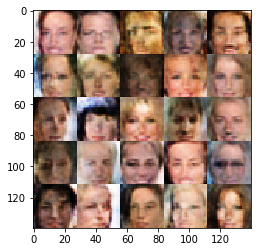

Epoch 1/1... Discriminator Loss: 1.1443... Generator Loss: 0.7416
Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 0.7066
Epoch 1/1... Discriminator Loss: 0.8976... Generator Loss: 1.2822
Epoch 1/1... Discriminator Loss: 0.8755... Generator Loss: 1.1613
Epoch 1/1... Discriminator Loss: 1.2981... Generator Loss: 0.7190
Epoch 1/1... Discriminator Loss: 1.4288... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 0.8765
Epoch 1/1... Discriminator Loss: 1.6228... Generator Loss: 0.4045
Epoch 1/1... Discriminator Loss: 1.4495... Generator Loss: 0.4615
Epoch 1/1... Discriminator Loss: 0.9496... Generator Loss: 1.1411


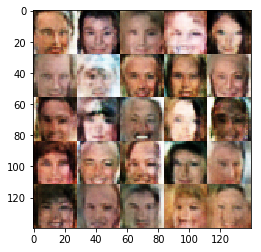

Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.8746
Epoch 1/1... Discriminator Loss: 1.8078... Generator Loss: 0.2875
Epoch 1/1... Discriminator Loss: 0.8981... Generator Loss: 1.0159
Epoch 1/1... Discriminator Loss: 1.0338... Generator Loss: 1.5528
Epoch 1/1... Discriminator Loss: 1.1487... Generator Loss: 0.8201
Epoch 1/1... Discriminator Loss: 0.9554... Generator Loss: 1.1975
Epoch 1/1... Discriminator Loss: 1.1913... Generator Loss: 0.6726
Epoch 1/1... Discriminator Loss: 1.0645... Generator Loss: 0.8279
Epoch 1/1... Discriminator Loss: 1.0596... Generator Loss: 0.8623
Epoch 1/1... Discriminator Loss: 1.0733... Generator Loss: 1.0339


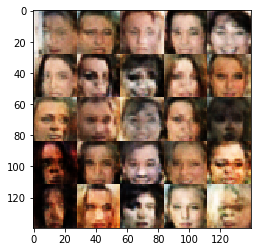

Epoch 1/1... Discriminator Loss: 0.8162... Generator Loss: 1.1208
Epoch 1/1... Discriminator Loss: 1.0757... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.9107
Epoch 1/1... Discriminator Loss: 1.0684... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.5450
Epoch 1/1... Discriminator Loss: 1.0879... Generator Loss: 0.8519
Epoch 1/1... Discriminator Loss: 1.4520... Generator Loss: 0.4634
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.6555... Generator Loss: 0.3410
Epoch 1/1... Discriminator Loss: 1.6710... Generator Loss: 0.3925


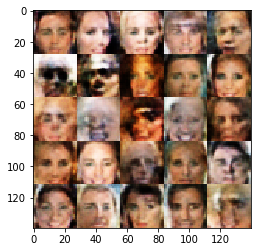

Epoch 1/1... Discriminator Loss: 1.1272... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 0.8214... Generator Loss: 1.2248
Epoch 1/1... Discriminator Loss: 0.9033... Generator Loss: 1.4099
Epoch 1/1... Discriminator Loss: 1.4734... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.1630... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.0415... Generator Loss: 0.8817
Epoch 1/1... Discriminator Loss: 1.1980... Generator Loss: 0.6422
Epoch 1/1... Discriminator Loss: 1.0367... Generator Loss: 1.0638
Epoch 1/1... Discriminator Loss: 0.9416... Generator Loss: 1.2086
Epoch 1/1... Discriminator Loss: 1.1910... Generator Loss: 0.6324


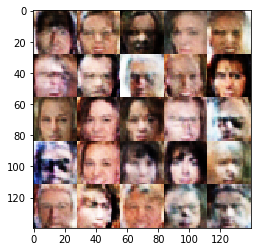

Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 0.6381
Epoch 1/1... Discriminator Loss: 0.9156... Generator Loss: 1.5603
Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.7216
Epoch 1/1... Discriminator Loss: 0.9715... Generator Loss: 1.1472
Epoch 1/1... Discriminator Loss: 1.6008... Generator Loss: 0.3439
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 0.9967... Generator Loss: 0.8860
Epoch 1/1... Discriminator Loss: 0.9734... Generator Loss: 0.9166
Epoch 1/1... Discriminator Loss: 1.6492... Generator Loss: 0.3686
Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.6443


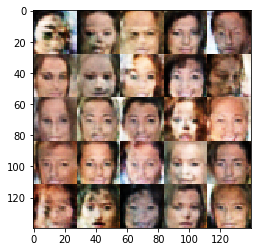

Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 1.3062... Generator Loss: 0.5673
Epoch 1/1... Discriminator Loss: 0.9933... Generator Loss: 1.2970
Epoch 1/1... Discriminator Loss: 0.9566... Generator Loss: 0.9833
Epoch 1/1... Discriminator Loss: 0.6583... Generator Loss: 1.8459
Epoch 1/1... Discriminator Loss: 1.0454... Generator Loss: 0.7635
Epoch 1/1... Discriminator Loss: 0.9221... Generator Loss: 1.4694
Epoch 1/1... Discriminator Loss: 1.1901... Generator Loss: 1.0935
Epoch 1/1... Discriminator Loss: 1.3541... Generator Loss: 0.5232
Epoch 1/1... Discriminator Loss: 0.9498... Generator Loss: 1.3157


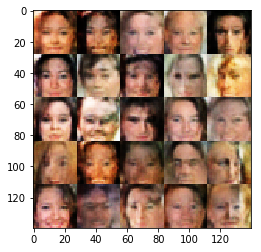

Epoch 1/1... Discriminator Loss: 1.2045... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.3724... Generator Loss: 0.5491
Epoch 1/1... Discriminator Loss: 1.2037... Generator Loss: 0.7243
Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 0.9729... Generator Loss: 0.9846
Epoch 1/1... Discriminator Loss: 0.8602... Generator Loss: 1.2215
Epoch 1/1... Discriminator Loss: 1.3112... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.0388... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.0035... Generator Loss: 0.8806
Epoch 1/1... Discriminator Loss: 1.0422... Generator Loss: 1.1761


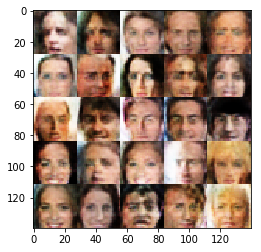

Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.1152... Generator Loss: 0.6892
Epoch 1/1... Discriminator Loss: 0.8910... Generator Loss: 1.1083
Epoch 1/1... Discriminator Loss: 1.1873... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 0.9152... Generator Loss: 1.0364
Epoch 1/1... Discriminator Loss: 0.9028... Generator Loss: 1.0719
Epoch 1/1... Discriminator Loss: 1.1135... Generator Loss: 1.3261
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 0.9430
Epoch 1/1... Discriminator Loss: 0.8924... Generator Loss: 0.9911
Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.7438


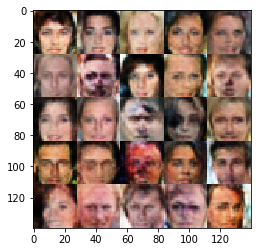

Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.1100... Generator Loss: 1.2812
Epoch 1/1... Discriminator Loss: 1.6876... Generator Loss: 0.3387
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 1.0426
Epoch 1/1... Discriminator Loss: 0.9342... Generator Loss: 1.0469
Epoch 1/1... Discriminator Loss: 0.9601... Generator Loss: 1.2436
Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.4491
Epoch 1/1... Discriminator Loss: 1.0970... Generator Loss: 0.8561
Epoch 1/1... Discriminator Loss: 0.9717... Generator Loss: 1.1793
Epoch 1/1... Discriminator Loss: 0.7447... Generator Loss: 1.5434


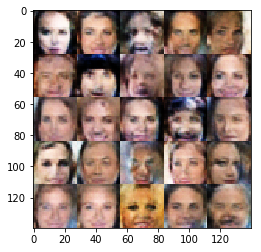

Epoch 1/1... Discriminator Loss: 1.0475... Generator Loss: 1.0325
Epoch 1/1... Discriminator Loss: 1.1147... Generator Loss: 1.0497
Epoch 1/1... Discriminator Loss: 1.3040... Generator Loss: 0.5940
Epoch 1/1... Discriminator Loss: 1.0554... Generator Loss: 1.0021
Epoch 1/1... Discriminator Loss: 0.9748... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 0.9061... Generator Loss: 1.3976
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.4819
Epoch 1/1... Discriminator Loss: 1.0683... Generator Loss: 1.0780
Epoch 1/1... Discriminator Loss: 0.9302... Generator Loss: 0.8690
Epoch 1/1... Discriminator Loss: 1.5691... Generator Loss: 0.3931


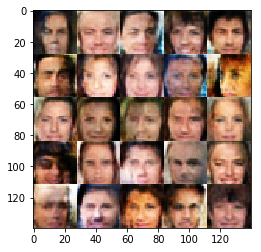

Epoch 1/1... Discriminator Loss: 0.9222... Generator Loss: 1.0047
Epoch 1/1... Discriminator Loss: 1.2446... Generator Loss: 0.6720
Epoch 1/1... Discriminator Loss: 1.1787... Generator Loss: 1.0196
Epoch 1/1... Discriminator Loss: 1.1548... Generator Loss: 0.7363
Epoch 1/1... Discriminator Loss: 1.2590... Generator Loss: 1.5229
Epoch 1/1... Discriminator Loss: 1.0631... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 0.9154... Generator Loss: 1.1914
Epoch 1/1... Discriminator Loss: 0.8253... Generator Loss: 1.2321
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.7955
Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 0.5266


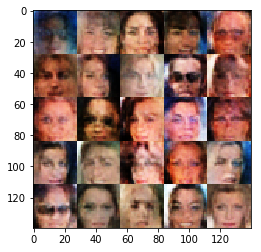

Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 0.5002
Epoch 1/1... Discriminator Loss: 1.0470... Generator Loss: 0.8097
Epoch 1/1... Discriminator Loss: 1.1124... Generator Loss: 1.1255
Epoch 1/1... Discriminator Loss: 1.2472... Generator Loss: 0.7705
Epoch 1/1... Discriminator Loss: 0.9507... Generator Loss: 0.8463
Epoch 1/1... Discriminator Loss: 0.8705... Generator Loss: 0.9966
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.5918
Epoch 1/1... Discriminator Loss: 1.2605... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.6368... Generator Loss: 0.5169
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 1.9030


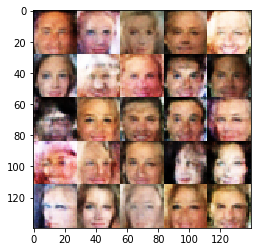

Epoch 1/1... Discriminator Loss: 1.1812... Generator Loss: 0.6741
Epoch 1/1... Discriminator Loss: 1.1230... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 1.1380... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 0.9163... Generator Loss: 1.2564
Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.6393... Generator Loss: 0.3834
Epoch 1/1... Discriminator Loss: 1.2088... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.1514... Generator Loss: 1.2674
Epoch 1/1... Discriminator Loss: 1.1924... Generator Loss: 1.6853
Epoch 1/1... Discriminator Loss: 1.0891... Generator Loss: 1.0677


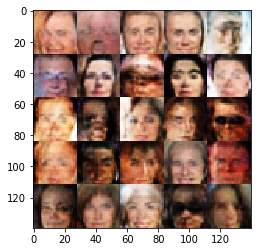

Epoch 1/1... Discriminator Loss: 1.3623... Generator Loss: 0.5218
Epoch 1/1... Discriminator Loss: 1.4205... Generator Loss: 0.5079
Epoch 1/1... Discriminator Loss: 1.2051... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.0942... Generator Loss: 0.8582
Epoch 1/1... Discriminator Loss: 0.9796... Generator Loss: 1.9366
Epoch 1/1... Discriminator Loss: 1.1027... Generator Loss: 0.7485
Epoch 1/1... Discriminator Loss: 0.9916... Generator Loss: 0.8568
Epoch 1/1... Discriminator Loss: 1.1724... Generator Loss: 0.6533
Epoch 1/1... Discriminator Loss: 0.7527... Generator Loss: 1.5212
Epoch 1/1... Discriminator Loss: 1.0124... Generator Loss: 0.9146


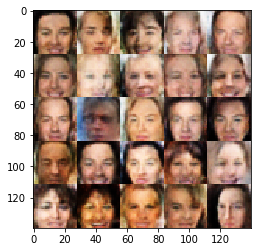

Epoch 1/1... Discriminator Loss: 1.4309... Generator Loss: 0.4540
Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 0.6788
Epoch 1/1... Discriminator Loss: 1.1042... Generator Loss: 0.9263
Epoch 1/1... Discriminator Loss: 1.2517... Generator Loss: 0.5937
Epoch 1/1... Discriminator Loss: 1.0255... Generator Loss: 0.9825
Epoch 1/1... Discriminator Loss: 1.1715... Generator Loss: 0.6317
Epoch 1/1... Discriminator Loss: 0.9677... Generator Loss: 0.9328
Epoch 1/1... Discriminator Loss: 0.8516... Generator Loss: 1.0792
Epoch 1/1... Discriminator Loss: 1.1406... Generator Loss: 0.6852
Epoch 1/1... Discriminator Loss: 0.7252... Generator Loss: 1.2520


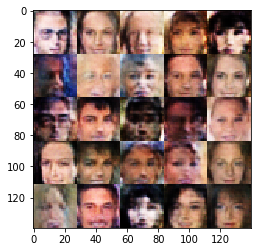

Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.5011
Epoch 1/1... Discriminator Loss: 0.9957... Generator Loss: 1.4759
Epoch 1/1... Discriminator Loss: 0.7935... Generator Loss: 1.1834
Epoch 1/1... Discriminator Loss: 1.2629... Generator Loss: 0.8918
Epoch 1/1... Discriminator Loss: 1.3404... Generator Loss: 0.5202
Epoch 1/1... Discriminator Loss: 0.7535... Generator Loss: 1.4736
Epoch 1/1... Discriminator Loss: 1.1119... Generator Loss: 0.8001
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.4502
Epoch 1/1... Discriminator Loss: 1.2383... Generator Loss: 0.5948
Epoch 1/1... Discriminator Loss: 0.8777... Generator Loss: 1.0246


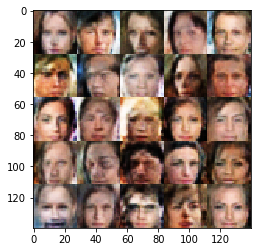

Epoch 1/1... Discriminator Loss: 1.0743... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 0.9270... Generator Loss: 1.1265
Epoch 1/1... Discriminator Loss: 1.1307... Generator Loss: 0.8183
Epoch 1/1... Discriminator Loss: 0.9591... Generator Loss: 0.9576
Epoch 1/1... Discriminator Loss: 0.9484... Generator Loss: 1.2908
Epoch 1/1... Discriminator Loss: 1.0601... Generator Loss: 0.8214
Epoch 1/1... Discriminator Loss: 1.0034... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.5608
Epoch 1/1... Discriminator Loss: 1.1972... Generator Loss: 0.6122


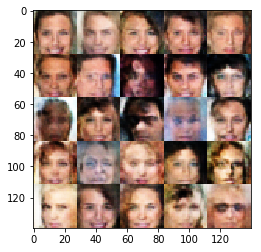

Epoch 1/1... Discriminator Loss: 0.9108... Generator Loss: 1.7715
Epoch 1/1... Discriminator Loss: 0.8225... Generator Loss: 1.2546
Epoch 1/1... Discriminator Loss: 0.8950... Generator Loss: 1.2667
Epoch 1/1... Discriminator Loss: 0.9792... Generator Loss: 0.9087
Epoch 1/1... Discriminator Loss: 1.0013... Generator Loss: 1.0699
Epoch 1/1... Discriminator Loss: 1.1639... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.0942... Generator Loss: 1.0315
Epoch 1/1... Discriminator Loss: 1.3438... Generator Loss: 0.4885
Epoch 1/1... Discriminator Loss: 1.1617... Generator Loss: 0.9563
Epoch 1/1... Discriminator Loss: 1.2142... Generator Loss: 0.6362


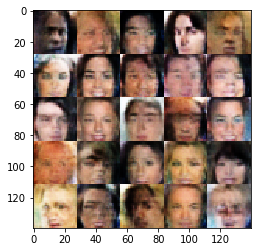

Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 1.4757... Generator Loss: 0.4925
Epoch 1/1... Discriminator Loss: 1.0295... Generator Loss: 0.7964
Epoch 1/1... Discriminator Loss: 1.5788... Generator Loss: 0.6409
Epoch 1/1... Discriminator Loss: 1.0756... Generator Loss: 0.8651
Epoch 1/1... Discriminator Loss: 1.0038... Generator Loss: 0.8304
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.6119
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.4761
Epoch 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.5173
Epoch 1/1... Discriminator Loss: 1.0083... Generator Loss: 1.7474


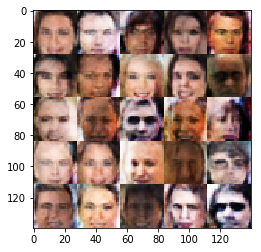

Epoch 1/1... Discriminator Loss: 1.0746... Generator Loss: 1.5076
Epoch 1/1... Discriminator Loss: 0.7979... Generator Loss: 1.1355
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 1.1275... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 0.7990... Generator Loss: 1.3747
Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.2452... Generator Loss: 0.8141
Epoch 1/1... Discriminator Loss: 1.0987... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 0.8031... Generator Loss: 1.6446
Epoch 1/1... Discriminator Loss: 1.3232... Generator Loss: 0.5269


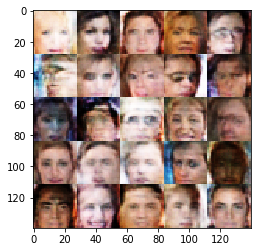

Epoch 1/1... Discriminator Loss: 1.7825... Generator Loss: 0.3137
Epoch 1/1... Discriminator Loss: 1.5539... Generator Loss: 0.3967
Epoch 1/1... Discriminator Loss: 1.0617... Generator Loss: 0.7531
Epoch 1/1... Discriminator Loss: 0.8074... Generator Loss: 1.5111
Epoch 1/1... Discriminator Loss: 1.0263... Generator Loss: 0.8479
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 1.0625... Generator Loss: 0.7663
Epoch 1/1... Discriminator Loss: 1.0804... Generator Loss: 0.9310
Epoch 1/1... Discriminator Loss: 1.2048... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 0.9693... Generator Loss: 0.8725


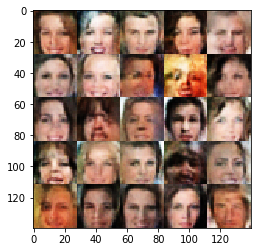

Epoch 1/1... Discriminator Loss: 1.1976... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.2301... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 1.3212... Generator Loss: 0.6382
Epoch 1/1... Discriminator Loss: 1.1830... Generator Loss: 0.6153
Epoch 1/1... Discriminator Loss: 0.8654... Generator Loss: 1.8304
Epoch 1/1... Discriminator Loss: 1.1632... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 1.1884... Generator Loss: 0.5954
Epoch 1/1... Discriminator Loss: 1.1010... Generator Loss: 1.6419
Epoch 1/1... Discriminator Loss: 1.0846... Generator Loss: 0.8314
Epoch 1/1... Discriminator Loss: 0.8662... Generator Loss: 1.2406


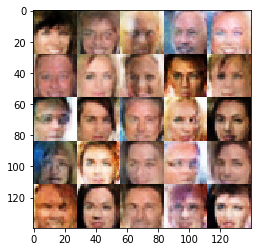

Epoch 1/1... Discriminator Loss: 1.0543... Generator Loss: 0.8259
Epoch 1/1... Discriminator Loss: 0.9835... Generator Loss: 0.9406
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 0.6511
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.5656
Epoch 1/1... Discriminator Loss: 1.1996... Generator Loss: 1.7035
Epoch 1/1... Discriminator Loss: 1.6634... Generator Loss: 0.3767
Epoch 1/1... Discriminator Loss: 1.2649... Generator Loss: 0.5728
Epoch 1/1... Discriminator Loss: 1.0439... Generator Loss: 0.8753
Epoch 1/1... Discriminator Loss: 0.9697... Generator Loss: 1.5655
Epoch 1/1... Discriminator Loss: 1.2000... Generator Loss: 0.5991


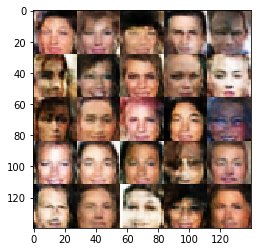

Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.5779
Epoch 1/1... Discriminator Loss: 1.0967... Generator Loss: 0.8378
Epoch 1/1... Discriminator Loss: 1.3697... Generator Loss: 0.6091
Epoch 1/1... Discriminator Loss: 0.7860... Generator Loss: 1.2016
Epoch 1/1... Discriminator Loss: 1.0412... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 0.9628... Generator Loss: 0.9530
Epoch 1/1... Discriminator Loss: 1.0737... Generator Loss: 1.3798
Epoch 1/1... Discriminator Loss: 1.2488... Generator Loss: 0.5575
Epoch 1/1... Discriminator Loss: 0.7818... Generator Loss: 1.6546
Epoch 1/1... Discriminator Loss: 0.9725... Generator Loss: 0.8876


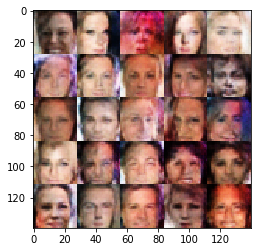

Epoch 1/1... Discriminator Loss: 1.3739... Generator Loss: 0.4935
Epoch 1/1... Discriminator Loss: 0.9104... Generator Loss: 1.1506
Epoch 1/1... Discriminator Loss: 1.1201... Generator Loss: 0.7158
Epoch 1/1... Discriminator Loss: 1.5872... Generator Loss: 0.3559
Epoch 1/1... Discriminator Loss: 1.1617... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 1.0513... Generator Loss: 0.8726
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.4669
Epoch 1/1... Discriminator Loss: 1.2006... Generator Loss: 0.9252
Epoch 1/1... Discriminator Loss: 1.8273... Generator Loss: 0.3213
Epoch 1/1... Discriminator Loss: 1.2521... Generator Loss: 0.6968


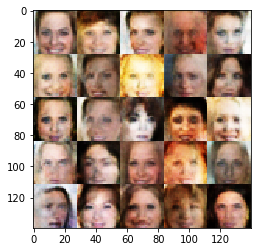

Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 1.5608
Epoch 1/1... Discriminator Loss: 1.1500... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 1.1429... Generator Loss: 0.6849
Epoch 1/1... Discriminator Loss: 1.0068... Generator Loss: 0.8215
Epoch 1/1... Discriminator Loss: 1.0864... Generator Loss: 0.8592
Epoch 1/1... Discriminator Loss: 1.0402... Generator Loss: 1.1265
Epoch 1/1... Discriminator Loss: 1.2150... Generator Loss: 1.2361
Epoch 1/1... Discriminator Loss: 1.0096... Generator Loss: 1.0878
Epoch 1/1... Discriminator Loss: 0.9296... Generator Loss: 1.0742
Epoch 1/1... Discriminator Loss: 1.2108... Generator Loss: 0.6646


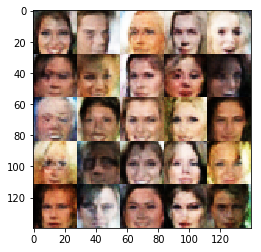

Epoch 1/1... Discriminator Loss: 1.4307... Generator Loss: 0.4620
Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.6238
Epoch 1/1... Discriminator Loss: 1.0447... Generator Loss: 0.9506
Epoch 1/1... Discriminator Loss: 1.6554... Generator Loss: 0.3552
Epoch 1/1... Discriminator Loss: 0.9225... Generator Loss: 1.3834
Epoch 1/1... Discriminator Loss: 1.1996... Generator Loss: 0.6636
Epoch 1/1... Discriminator Loss: 1.0742... Generator Loss: 0.7604
Epoch 1/1... Discriminator Loss: 1.3734... Generator Loss: 0.4898
Epoch 1/1... Discriminator Loss: 0.9503... Generator Loss: 0.9826
Epoch 1/1... Discriminator Loss: 1.1209... Generator Loss: 0.7671


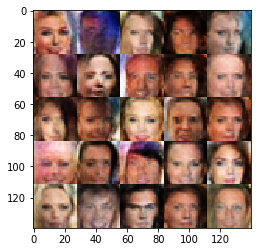

Epoch 1/1... Discriminator Loss: 1.0958... Generator Loss: 0.8187
Epoch 1/1... Discriminator Loss: 1.1873... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 0.8988... Generator Loss: 1.0649
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.5818
Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.5266
Epoch 1/1... Discriminator Loss: 1.0093... Generator Loss: 1.1673
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.5970
Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 0.6237
Epoch 1/1... Discriminator Loss: 0.9116... Generator Loss: 1.1901
Epoch 1/1... Discriminator Loss: 1.0226... Generator Loss: 0.8310


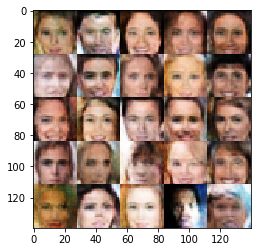

Epoch 1/1... Discriminator Loss: 1.1289... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 1.0301... Generator Loss: 1.1564
Epoch 1/1... Discriminator Loss: 1.4670... Generator Loss: 0.4136
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 1.4752
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.5492
Epoch 1/1... Discriminator Loss: 1.0762... Generator Loss: 1.0975
Epoch 1/1... Discriminator Loss: 1.7193... Generator Loss: 0.3354
Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 0.6885
Epoch 1/1... Discriminator Loss: 1.3363... Generator Loss: 0.5760


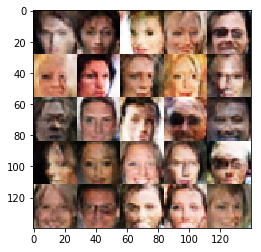

Epoch 1/1... Discriminator Loss: 0.9104... Generator Loss: 1.2139
Epoch 1/1... Discriminator Loss: 0.8994... Generator Loss: 1.3232
Epoch 1/1... Discriminator Loss: 1.0044... Generator Loss: 1.1853
Epoch 1/1... Discriminator Loss: 1.1060... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 2.3575
Epoch 1/1... Discriminator Loss: 1.6977... Generator Loss: 0.3898
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.6045
Epoch 1/1... Discriminator Loss: 0.9091... Generator Loss: 0.9820
Epoch 1/1... Discriminator Loss: 1.1203... Generator Loss: 0.7672
Epoch 1/1... Discriminator Loss: 1.0304... Generator Loss: 0.9527


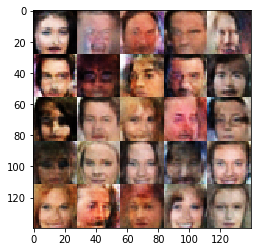

Epoch 1/1... Discriminator Loss: 1.0724... Generator Loss: 0.9549
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 0.6225
Epoch 1/1... Discriminator Loss: 1.0261... Generator Loss: 1.3264
Epoch 1/1... Discriminator Loss: 1.8325... Generator Loss: 0.2849
Epoch 1/1... Discriminator Loss: 1.0366... Generator Loss: 0.9904
Epoch 1/1... Discriminator Loss: 1.5254... Generator Loss: 0.4146
Epoch 1/1... Discriminator Loss: 0.7772... Generator Loss: 1.4553
Epoch 1/1... Discriminator Loss: 1.1777... Generator Loss: 0.7212
Epoch 1/1... Discriminator Loss: 1.2308... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 0.9186... Generator Loss: 0.9517


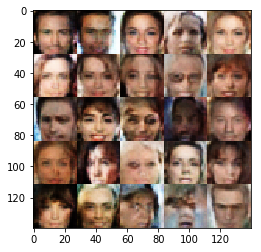

Epoch 1/1... Discriminator Loss: 1.5590... Generator Loss: 0.4585
Epoch 1/1... Discriminator Loss: 1.0122... Generator Loss: 1.0223
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.4993
Epoch 1/1... Discriminator Loss: 0.9608... Generator Loss: 0.9734
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.5766
Epoch 1/1... Discriminator Loss: 1.0373... Generator Loss: 0.7698
Epoch 1/1... Discriminator Loss: 1.1796... Generator Loss: 0.6239
Epoch 1/1... Discriminator Loss: 1.0660... Generator Loss: 0.9111
Epoch 1/1... Discriminator Loss: 1.1294... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.2423... Generator Loss: 0.6015


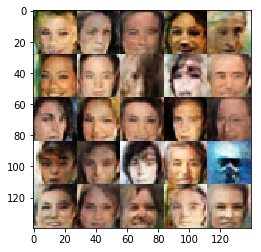

Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.8502
Epoch 1/1... Discriminator Loss: 1.0230... Generator Loss: 0.8655
Epoch 1/1... Discriminator Loss: 1.0080... Generator Loss: 0.8516
Epoch 1/1... Discriminator Loss: 1.1465... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.0107... Generator Loss: 1.1452
Epoch 1/1... Discriminator Loss: 0.9267... Generator Loss: 0.9199
Epoch 1/1... Discriminator Loss: 1.0203... Generator Loss: 0.9555
Epoch 1/1... Discriminator Loss: 1.0730... Generator Loss: 1.3347
Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.4608
Epoch 1/1... Discriminator Loss: 1.0056... Generator Loss: 0.8922


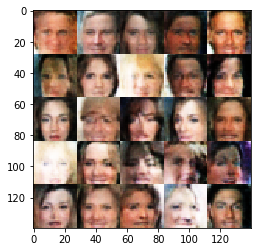

Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.5208
Epoch 1/1... Discriminator Loss: 1.3875... Generator Loss: 0.4730
Epoch 1/1... Discriminator Loss: 0.7526... Generator Loss: 1.5283
Epoch 1/1... Discriminator Loss: 1.0245... Generator Loss: 0.9457
Epoch 1/1... Discriminator Loss: 0.9650... Generator Loss: 0.9146
Epoch 1/1... Discriminator Loss: 0.9342... Generator Loss: 1.0241
Epoch 1/1... Discriminator Loss: 1.2998... Generator Loss: 1.0650
Epoch 1/1... Discriminator Loss: 0.8542... Generator Loss: 1.0650
Epoch 1/1... Discriminator Loss: 1.1540... Generator Loss: 0.7010
Epoch 1/1... Discriminator Loss: 1.1158... Generator Loss: 0.6932


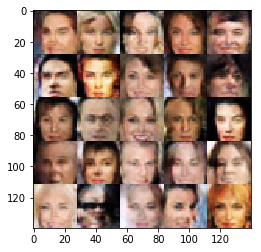

Epoch 1/1... Discriminator Loss: 0.9129... Generator Loss: 1.0843
Epoch 1/1... Discriminator Loss: 0.8795... Generator Loss: 1.1434
Epoch 1/1... Discriminator Loss: 0.7685... Generator Loss: 1.2408
Epoch 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.5989
Epoch 1/1... Discriminator Loss: 1.1844... Generator Loss: 0.8730
Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.8245
Epoch 1/1... Discriminator Loss: 1.1213... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.6336
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.5978
Epoch 1/1... Discriminator Loss: 1.4048... Generator Loss: 0.4772


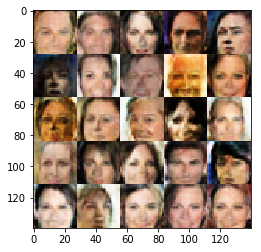

Epoch 1/1... Discriminator Loss: 0.9057... Generator Loss: 1.0690
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 0.8189... Generator Loss: 1.3255
Epoch 1/1... Discriminator Loss: 0.9307... Generator Loss: 1.0713
Epoch 1/1... Discriminator Loss: 1.1717... Generator Loss: 0.6942
Epoch 1/1... Discriminator Loss: 1.1954... Generator Loss: 0.6314
Epoch 1/1... Discriminator Loss: 1.0574... Generator Loss: 1.1199
Epoch 1/1... Discriminator Loss: 1.2905... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.1410... Generator Loss: 0.8569
Epoch 1/1... Discriminator Loss: 1.1412... Generator Loss: 0.7446


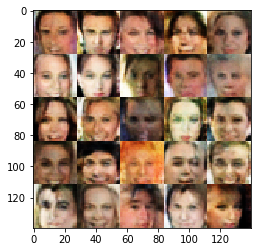

Epoch 1/1... Discriminator Loss: 1.4447... Generator Loss: 0.4524
Epoch 1/1... Discriminator Loss: 0.9545... Generator Loss: 0.9214
Epoch 1/1... Discriminator Loss: 1.1297... Generator Loss: 0.6557
Epoch 1/1... Discriminator Loss: 1.0704... Generator Loss: 0.8014
Epoch 1/1... Discriminator Loss: 1.2897... Generator Loss: 0.6432
Epoch 1/1... Discriminator Loss: 1.1848... Generator Loss: 0.6554
Epoch 1/1... Discriminator Loss: 1.2333... Generator Loss: 0.9197
Epoch 1/1... Discriminator Loss: 1.8004... Generator Loss: 0.2715
Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 0.5600
Epoch 1/1... Discriminator Loss: 0.9095... Generator Loss: 1.4153


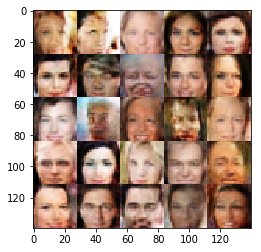

Epoch 1/1... Discriminator Loss: 0.9775... Generator Loss: 0.9348
Epoch 1/1... Discriminator Loss: 0.9043... Generator Loss: 1.3415
Epoch 1/1... Discriminator Loss: 1.0396... Generator Loss: 1.2657
Epoch 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.7716
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.5774
Epoch 1/1... Discriminator Loss: 1.9721... Generator Loss: 0.2500
Epoch 1/1... Discriminator Loss: 1.0489... Generator Loss: 0.8208
Epoch 1/1... Discriminator Loss: 1.6409... Generator Loss: 0.3494
Epoch 1/1... Discriminator Loss: 1.1570... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.5626... Generator Loss: 0.3783


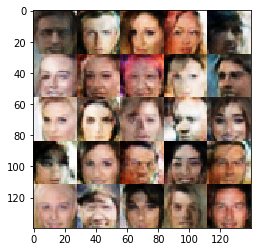

Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 0.7884
Epoch 1/1... Discriminator Loss: 1.0297... Generator Loss: 1.0938
Epoch 1/1... Discriminator Loss: 1.7616... Generator Loss: 0.2901
Epoch 1/1... Discriminator Loss: 0.9588... Generator Loss: 1.2002
Epoch 1/1... Discriminator Loss: 1.1921... Generator Loss: 0.6095
Epoch 1/1... Discriminator Loss: 1.8226... Generator Loss: 0.2828
Epoch 1/1... Discriminator Loss: 1.2547... Generator Loss: 0.6575
Epoch 1/1... Discriminator Loss: 1.0445... Generator Loss: 0.7827
Epoch 1/1... Discriminator Loss: 1.0475... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.1596... Generator Loss: 0.6445


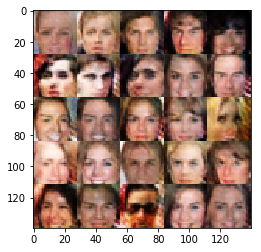

Epoch 1/1... Discriminator Loss: 1.5020... Generator Loss: 0.6124
Epoch 1/1... Discriminator Loss: 0.9666... Generator Loss: 1.0652
Epoch 1/1... Discriminator Loss: 1.0232... Generator Loss: 0.8487
Epoch 1/1... Discriminator Loss: 0.7505... Generator Loss: 1.4030
Epoch 1/1... Discriminator Loss: 1.1772... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 0.8758... Generator Loss: 1.5131
Epoch 1/1... Discriminator Loss: 1.0837... Generator Loss: 0.8209
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.6497
Epoch 1/1... Discriminator Loss: 0.9070... Generator Loss: 0.9536
Epoch 1/1... Discriminator Loss: 1.3536... Generator Loss: 0.4840


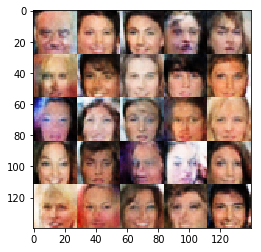

Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.7153
Epoch 1/1... Discriminator Loss: 1.0022... Generator Loss: 1.1056
Epoch 1/1... Discriminator Loss: 1.1245... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 0.9974... Generator Loss: 0.9803
Epoch 1/1... Discriminator Loss: 0.9344... Generator Loss: 1.1723
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.5846
Epoch 1/1... Discriminator Loss: 1.1987... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.7652
Epoch 1/1... Discriminator Loss: 0.8642... Generator Loss: 1.2370
Epoch 1/1... Discriminator Loss: 1.0759... Generator Loss: 1.0492


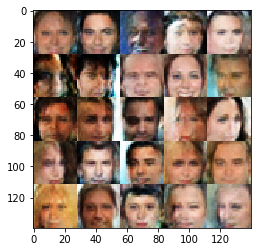

Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.6581
Epoch 1/1... Discriminator Loss: 0.7980... Generator Loss: 1.2324
Epoch 1/1... Discriminator Loss: 0.8920... Generator Loss: 1.0771
Epoch 1/1... Discriminator Loss: 0.9611... Generator Loss: 1.2286
Epoch 1/1... Discriminator Loss: 1.5059... Generator Loss: 0.4528
Epoch 1/1... Discriminator Loss: 1.1944... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 1.0316... Generator Loss: 0.9675
Epoch 1/1... Discriminator Loss: 0.9158... Generator Loss: 1.0094
Epoch 1/1... Discriminator Loss: 1.0640... Generator Loss: 0.8768


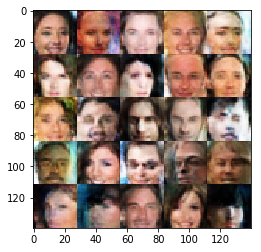

Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.4965
Epoch 1/1... Discriminator Loss: 1.0450... Generator Loss: 0.8120
Epoch 1/1... Discriminator Loss: 1.0770... Generator Loss: 0.7877
Epoch 1/1... Discriminator Loss: 0.8305... Generator Loss: 1.1892
Epoch 1/1... Discriminator Loss: 1.3012... Generator Loss: 0.5563
Epoch 1/1... Discriminator Loss: 1.2135... Generator Loss: 0.7025
Epoch 1/1... Discriminator Loss: 1.1482... Generator Loss: 0.6254
Epoch 1/1... Discriminator Loss: 1.2125... Generator Loss: 0.6114
Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 0.6972
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 0.5764


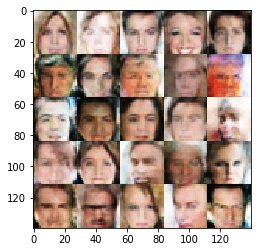

Epoch 1/1... Discriminator Loss: 1.4538... Generator Loss: 0.4416
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 0.9252
Epoch 1/1... Discriminator Loss: 1.0189... Generator Loss: 1.1712
Epoch 1/1... Discriminator Loss: 0.9315... Generator Loss: 0.9321
Epoch 1/1... Discriminator Loss: 0.9049... Generator Loss: 1.2672
Epoch 1/1... Discriminator Loss: 1.2309... Generator Loss: 0.5804
Epoch 1/1... Discriminator Loss: 1.0992... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 0.7054... Generator Loss: 1.4996
Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 0.9335
Epoch 1/1... Discriminator Loss: 1.1378... Generator Loss: 0.8552


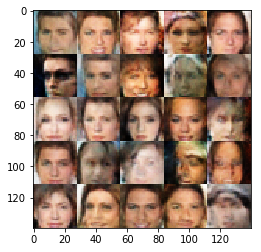

Epoch 1/1... Discriminator Loss: 1.1531... Generator Loss: 1.0302
Epoch 1/1... Discriminator Loss: 1.2018... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 0.7935... Generator Loss: 1.1508
Epoch 1/1... Discriminator Loss: 1.0796... Generator Loss: 0.7146
Epoch 1/1... Discriminator Loss: 1.0125... Generator Loss: 0.8061
Epoch 1/1... Discriminator Loss: 1.0567... Generator Loss: 0.8301
Epoch 1/1... Discriminator Loss: 1.2160... Generator Loss: 0.6020
Epoch 1/1... Discriminator Loss: 0.8383... Generator Loss: 1.3052
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.5074
Epoch 1/1... Discriminator Loss: 1.2646... Generator Loss: 0.6649


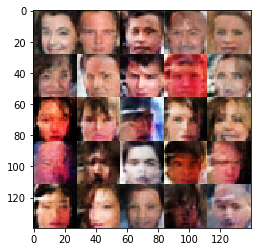

Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.4868
Epoch 1/1... Discriminator Loss: 0.9478... Generator Loss: 1.0132
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.5857
Epoch 1/1... Discriminator Loss: 1.0380... Generator Loss: 0.8369
Epoch 1/1... Discriminator Loss: 0.8366... Generator Loss: 1.2014
Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 0.5813
Epoch 1/1... Discriminator Loss: 1.1432... Generator Loss: 0.6517
Epoch 1/1... Discriminator Loss: 1.1080... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 1.2386... Generator Loss: 0.6436
Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 0.5124


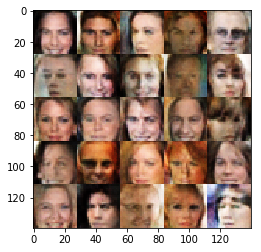

Epoch 1/1... Discriminator Loss: 0.8810... Generator Loss: 1.0923
Epoch 1/1... Discriminator Loss: 1.1092... Generator Loss: 0.8161
Epoch 1/1... Discriminator Loss: 1.2067... Generator Loss: 0.6268
Epoch 1/1... Discriminator Loss: 1.4765... Generator Loss: 0.4299
Epoch 1/1... Discriminator Loss: 1.0279... Generator Loss: 1.7586
Epoch 1/1... Discriminator Loss: 1.2403... Generator Loss: 1.1237
Epoch 1/1... Discriminator Loss: 1.0487... Generator Loss: 0.8814
Epoch 1/1... Discriminator Loss: 0.5990... Generator Loss: 2.0774
Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 0.9450
Epoch 1/1... Discriminator Loss: 1.1019... Generator Loss: 0.7009


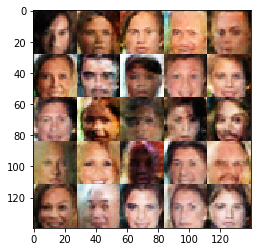

Epoch 1/1... Discriminator Loss: 0.9389... Generator Loss: 0.9314
Epoch 1/1... Discriminator Loss: 0.9270... Generator Loss: 1.0751
Epoch 1/1... Discriminator Loss: 0.8655... Generator Loss: 1.2046
Epoch 1/1... Discriminator Loss: 1.5144... Generator Loss: 0.4370
Epoch 1/1... Discriminator Loss: 2.0256... Generator Loss: 0.2659
Epoch 1/1... Discriminator Loss: 1.1730... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 0.8434... Generator Loss: 1.6416
Epoch 1/1... Discriminator Loss: 1.2570... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.0932... Generator Loss: 0.7353
Epoch 1/1... Discriminator Loss: 1.0591... Generator Loss: 0.9653


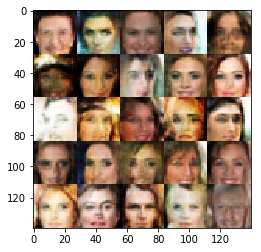

Epoch 1/1... Discriminator Loss: 0.9945... Generator Loss: 0.8558
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.1640... Generator Loss: 0.7913
Epoch 1/1... Discriminator Loss: 0.9008... Generator Loss: 1.2878
Epoch 1/1... Discriminator Loss: 1.1654... Generator Loss: 0.6702
Epoch 1/1... Discriminator Loss: 0.9548... Generator Loss: 0.9298
Epoch 1/1... Discriminator Loss: 1.0029... Generator Loss: 1.0198
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.5039
Epoch 1/1... Discriminator Loss: 0.9625... Generator Loss: 1.4789
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.4428


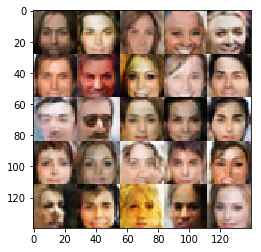

Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.9982... Generator Loss: 0.2398
Epoch 1/1... Discriminator Loss: 1.0815... Generator Loss: 1.1178
Epoch 1/1... Discriminator Loss: 0.9553... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 0.9833... Generator Loss: 1.0744
Epoch 1/1... Discriminator Loss: 1.0201... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 1.1199... Generator Loss: 0.7131
Epoch 1/1... Discriminator Loss: 0.9798... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 1.6102... Generator Loss: 0.3441
Epoch 1/1... Discriminator Loss: 1.0145... Generator Loss: 0.9107


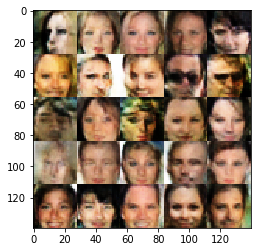

Epoch 1/1... Discriminator Loss: 1.1539... Generator Loss: 0.7256
Epoch 1/1... Discriminator Loss: 1.1294... Generator Loss: 0.6742
Epoch 1/1... Discriminator Loss: 1.0224... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 1.6516... Generator Loss: 0.3373
Epoch 1/1... Discriminator Loss: 0.8928... Generator Loss: 1.8307
Epoch 1/1... Discriminator Loss: 1.1893... Generator Loss: 0.9953
Epoch 1/1... Discriminator Loss: 1.1298... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 0.9876... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.2055... Generator Loss: 0.6562
Epoch 1/1... Discriminator Loss: 0.9636... Generator Loss: 0.8957


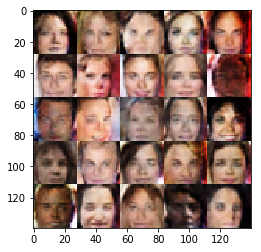

Epoch 1/1... Discriminator Loss: 1.7673... Generator Loss: 0.3079
Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 1.1640
Epoch 1/1... Discriminator Loss: 1.3505... Generator Loss: 0.5176
Epoch 1/1... Discriminator Loss: 0.8677... Generator Loss: 1.0413
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 1.6010
Epoch 1/1... Discriminator Loss: 0.9407... Generator Loss: 1.3339
Epoch 1/1... Discriminator Loss: 1.5141... Generator Loss: 0.3871
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.5800


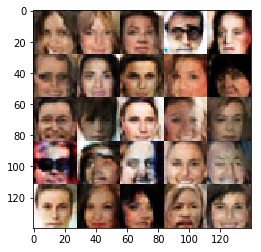

Epoch 1/1... Discriminator Loss: 0.9999... Generator Loss: 0.9616
Epoch 1/1... Discriminator Loss: 1.0307... Generator Loss: 0.8265
Epoch 1/1... Discriminator Loss: 1.5575... Generator Loss: 0.4048
Epoch 1/1... Discriminator Loss: 1.0088... Generator Loss: 0.8879
Epoch 1/1... Discriminator Loss: 1.0167... Generator Loss: 0.9242
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.5380
Epoch 1/1... Discriminator Loss: 0.9212... Generator Loss: 1.1922
Epoch 1/1... Discriminator Loss: 0.9179... Generator Loss: 0.9472
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.4799
Epoch 1/1... Discriminator Loss: 1.4648... Generator Loss: 0.4344


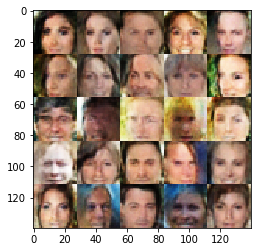

Epoch 1/1... Discriminator Loss: 1.2583... Generator Loss: 0.5803
Epoch 1/1... Discriminator Loss: 1.0864... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 0.7813... Generator Loss: 1.1819
Epoch 1/1... Discriminator Loss: 1.0379... Generator Loss: 1.5227
Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 1.3038
Epoch 1/1... Discriminator Loss: 1.1175... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.0045... Generator Loss: 0.8544
Epoch 1/1... Discriminator Loss: 1.1323... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 0.9581... Generator Loss: 1.2128
Epoch 1/1... Discriminator Loss: 0.8618... Generator Loss: 1.6270


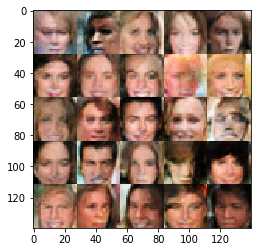

Epoch 1/1... Discriminator Loss: 1.0160... Generator Loss: 0.8077
Epoch 1/1... Discriminator Loss: 1.7210... Generator Loss: 0.3439
Epoch 1/1... Discriminator Loss: 1.2460... Generator Loss: 1.0866
Epoch 1/1... Discriminator Loss: 0.9108... Generator Loss: 1.3525
Epoch 1/1... Discriminator Loss: 1.0215... Generator Loss: 1.0605
Epoch 1/1... Discriminator Loss: 0.9762... Generator Loss: 1.0253
Epoch 1/1... Discriminator Loss: 1.1657... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.1539... Generator Loss: 0.6498
Epoch 1/1... Discriminator Loss: 1.0978... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 0.8343... Generator Loss: 1.2312


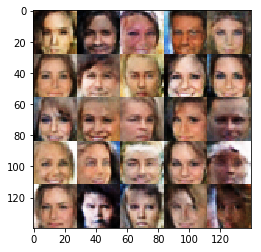

Epoch 1/1... Discriminator Loss: 1.1887... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 1.3233... Generator Loss: 0.5039
Epoch 1/1... Discriminator Loss: 0.8760... Generator Loss: 1.1903
Epoch 1/1... Discriminator Loss: 1.1454... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 1.0501
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.5753
Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.6103
Epoch 1/1... Discriminator Loss: 1.2646... Generator Loss: 0.5491
Epoch 1/1... Discriminator Loss: 0.9075... Generator Loss: 1.3458
Epoch 1/1... Discriminator Loss: 1.6684... Generator Loss: 0.3371


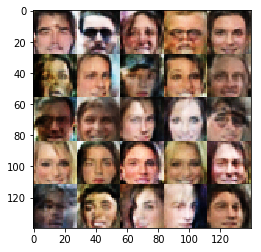

Epoch 1/1... Discriminator Loss: 1.0343... Generator Loss: 0.8632
Epoch 1/1... Discriminator Loss: 1.3546... Generator Loss: 0.5086
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 1.4793... Generator Loss: 0.4606
Epoch 1/1... Discriminator Loss: 1.3181... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.5317
Epoch 1/1... Discriminator Loss: 1.0025... Generator Loss: 1.1686
Epoch 1/1... Discriminator Loss: 1.1421... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.2462... Generator Loss: 0.5911


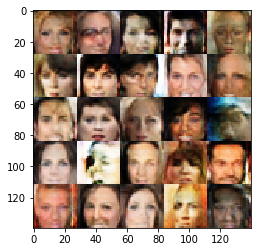

Epoch 1/1... Discriminator Loss: 1.0126... Generator Loss: 0.8818
Epoch 1/1... Discriminator Loss: 1.1916... Generator Loss: 0.6326
Epoch 1/1... Discriminator Loss: 1.1269... Generator Loss: 0.7796
Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.0867... Generator Loss: 0.9144
Epoch 1/1... Discriminator Loss: 1.3137... Generator Loss: 0.6635
Epoch 1/1... Discriminator Loss: 1.7191... Generator Loss: 0.3416
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 0.4773
Epoch 1/1... Discriminator Loss: 0.9497... Generator Loss: 1.0504
Epoch 1/1... Discriminator Loss: 1.3125... Generator Loss: 0.5852


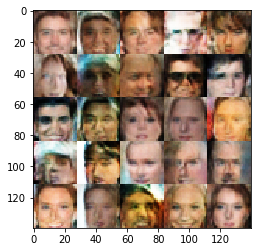

Epoch 1/1... Discriminator Loss: 1.2303... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.1169... Generator Loss: 0.7449
Epoch 1/1... Discriminator Loss: 1.5270... Generator Loss: 0.3982
Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 0.6147
Epoch 1/1... Discriminator Loss: 1.1469... Generator Loss: 0.6880
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 0.6875
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.5600
Epoch 1/1... Discriminator Loss: 1.2609... Generator Loss: 0.5435
Epoch 1/1... Discriminator Loss: 1.0320... Generator Loss: 1.5060
Epoch 1/1... Discriminator Loss: 1.2656... Generator Loss: 0.5783


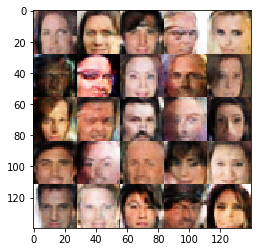

Epoch 1/1... Discriminator Loss: 1.5927... Generator Loss: 2.0446
Epoch 1/1... Discriminator Loss: 1.1873... Generator Loss: 0.6301
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.6169
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 1.5817... Generator Loss: 0.5200
Epoch 1/1... Discriminator Loss: 1.0060... Generator Loss: 0.8575
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.4829
Epoch 1/1... Discriminator Loss: 0.9200... Generator Loss: 1.4060
Epoch 1/1... Discriminator Loss: 1.2201... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.5285


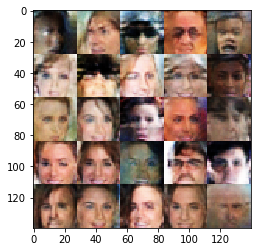

Epoch 1/1... Discriminator Loss: 1.4658... Generator Loss: 0.4432
Epoch 1/1... Discriminator Loss: 1.5412... Generator Loss: 0.3888
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.4539... Generator Loss: 0.4785
Epoch 1/1... Discriminator Loss: 0.9498... Generator Loss: 0.9933
Epoch 1/1... Discriminator Loss: 1.1150... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.4719
Epoch 1/1... Discriminator Loss: 1.2168... Generator Loss: 0.7264
Epoch 1/1... Discriminator Loss: 1.2199... Generator Loss: 0.9009
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.4793


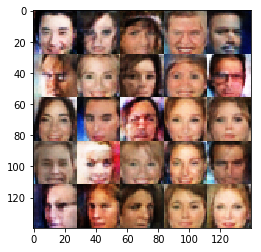

Epoch 1/1... Discriminator Loss: 1.7074... Generator Loss: 0.3134
Epoch 1/1... Discriminator Loss: 0.9839... Generator Loss: 0.9726
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.7784
Epoch 1/1... Discriminator Loss: 1.1385... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.0019... Generator Loss: 0.8382
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 0.9130
Epoch 1/1... Discriminator Loss: 1.1255... Generator Loss: 0.8318
Epoch 1/1... Discriminator Loss: 1.0757... Generator Loss: 0.8027
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 0.5948


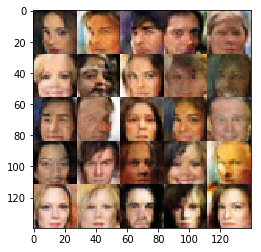

Epoch 1/1... Discriminator Loss: 1.3139... Generator Loss: 0.5360
Epoch 1/1... Discriminator Loss: 0.9884... Generator Loss: 1.7418
Epoch 1/1... Discriminator Loss: 1.4804... Generator Loss: 0.4263
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.6888
Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.7059
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.5759
Epoch 1/1... Discriminator Loss: 0.9628... Generator Loss: 0.9370
Epoch 1/1... Discriminator Loss: 1.0545... Generator Loss: 1.2176
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.5302
Epoch 1/1... Discriminator Loss: 0.8222... Generator Loss: 1.4452


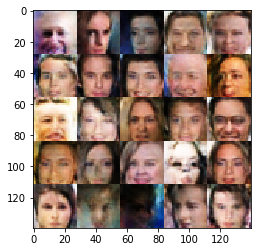

Epoch 1/1... Discriminator Loss: 0.7744... Generator Loss: 1.3259
Epoch 1/1... Discriminator Loss: 1.0405... Generator Loss: 1.7131
Epoch 1/1... Discriminator Loss: 0.9749... Generator Loss: 0.8591
Epoch 1/1... Discriminator Loss: 1.1134... Generator Loss: 0.8305
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.5755
Epoch 1/1... Discriminator Loss: 0.7745... Generator Loss: 1.1708
Epoch 1/1... Discriminator Loss: 0.8893... Generator Loss: 1.1835
Epoch 1/1... Discriminator Loss: 1.3767... Generator Loss: 0.4771
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 1.1167
Epoch 1/1... Discriminator Loss: 1.5212... Generator Loss: 0.4000


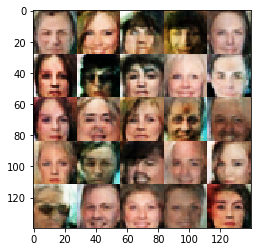

Epoch 1/1... Discriminator Loss: 0.8253... Generator Loss: 1.2176
Epoch 1/1... Discriminator Loss: 1.0589... Generator Loss: 0.7853
Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 1.0999
Epoch 1/1... Discriminator Loss: 0.9710... Generator Loss: 0.9554
Epoch 1/1... Discriminator Loss: 1.2733... Generator Loss: 0.6092
Epoch 1/1... Discriminator Loss: 0.8343... Generator Loss: 1.0820
Epoch 1/1... Discriminator Loss: 0.9245... Generator Loss: 1.5337
Epoch 1/1... Discriminator Loss: 0.6946... Generator Loss: 1.3683
Epoch 1/1... Discriminator Loss: 1.7662... Generator Loss: 0.3067
Epoch 1/1... Discriminator Loss: 1.0487... Generator Loss: 0.7754


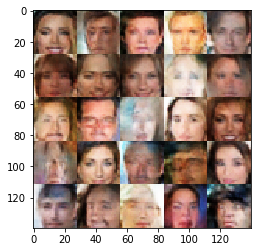

Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.8835
Epoch 1/1... Discriminator Loss: 0.9419... Generator Loss: 0.8911
Epoch 1/1... Discriminator Loss: 0.7193... Generator Loss: 1.7885
Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.5897
Epoch 1/1... Discriminator Loss: 0.9873... Generator Loss: 0.9575
Epoch 1/1... Discriminator Loss: 0.8925... Generator Loss: 0.9844
Epoch 1/1... Discriminator Loss: 1.1031... Generator Loss: 0.7137
Epoch 1/1... Discriminator Loss: 1.2720... Generator Loss: 0.5898
Epoch 1/1... Discriminator Loss: 0.9676... Generator Loss: 0.8470
Epoch 1/1... Discriminator Loss: 1.2237... Generator Loss: 0.6233


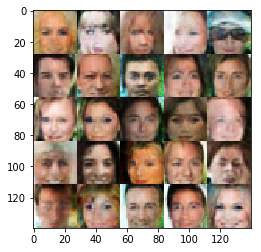

Epoch 1/1... Discriminator Loss: 1.1336... Generator Loss: 1.0531
Epoch 1/1... Discriminator Loss: 1.6278... Generator Loss: 0.3513
Epoch 1/1... Discriminator Loss: 1.3034... Generator Loss: 0.5458
Epoch 1/1... Discriminator Loss: 1.1336... Generator Loss: 0.7284
Epoch 1/1... Discriminator Loss: 1.1194... Generator Loss: 0.7878
Epoch 1/1... Discriminator Loss: 1.2481... Generator Loss: 0.9352
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.5683
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.6461
Epoch 1/1... Discriminator Loss: 1.3329... Generator Loss: 0.5263


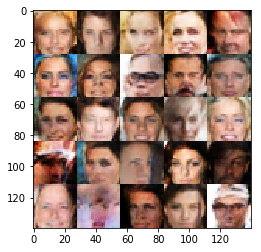

Epoch 1/1... Discriminator Loss: 0.9578... Generator Loss: 1.0232
Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 0.8833
Epoch 1/1... Discriminator Loss: 0.8439... Generator Loss: 1.1946
Epoch 1/1... Discriminator Loss: 0.9145... Generator Loss: 1.1694
Epoch 1/1... Discriminator Loss: 0.9878... Generator Loss: 0.7877
Epoch 1/1... Discriminator Loss: 1.4492... Generator Loss: 0.4915
Epoch 1/1... Discriminator Loss: 0.8996... Generator Loss: 0.9627
Epoch 1/1... Discriminator Loss: 1.0381... Generator Loss: 0.9130
Epoch 1/1... Discriminator Loss: 1.3408... Generator Loss: 0.4948
Epoch 1/1... Discriminator Loss: 1.0219... Generator Loss: 1.2517


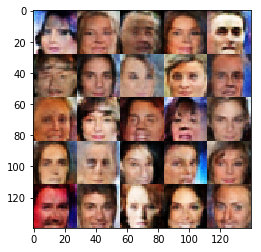

Epoch 1/1... Discriminator Loss: 1.1252... Generator Loss: 0.6905
Epoch 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.5912
Epoch 1/1... Discriminator Loss: 1.5954... Generator Loss: 0.3623
Epoch 1/1... Discriminator Loss: 0.7803... Generator Loss: 1.4221
Epoch 1/1... Discriminator Loss: 0.6780... Generator Loss: 1.7091
Epoch 1/1... Discriminator Loss: 1.0181... Generator Loss: 0.9033
Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 1.0308
Epoch 1/1... Discriminator Loss: 1.0544... Generator Loss: 1.0115
Epoch 1/1... Discriminator Loss: 1.1538... Generator Loss: 0.7928
Epoch 1/1... Discriminator Loss: 0.9853... Generator Loss: 0.9539


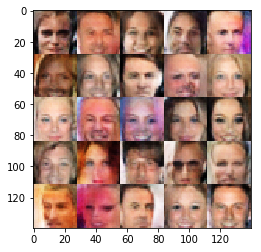

Epoch 1/1... Discriminator Loss: 1.1139... Generator Loss: 0.7132
Epoch 1/1... Discriminator Loss: 1.3226... Generator Loss: 0.5155
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.0813... Generator Loss: 0.7974
Epoch 1/1... Discriminator Loss: 1.1523... Generator Loss: 0.6739
Epoch 1/1... Discriminator Loss: 1.5244... Generator Loss: 0.4419
Epoch 1/1... Discriminator Loss: 0.9102... Generator Loss: 1.1770
Epoch 1/1... Discriminator Loss: 1.1897... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 1.2007
Epoch 1/1... Discriminator Loss: 1.3186... Generator Loss: 0.5735


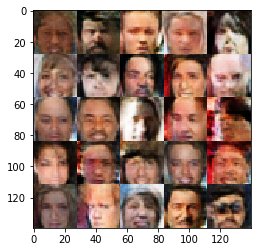

Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 1.4580... Generator Loss: 0.4911
Epoch 1/1... Discriminator Loss: 1.0045... Generator Loss: 1.0088
Epoch 1/1... Discriminator Loss: 1.3800... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 0.8783... Generator Loss: 1.0991
Epoch 1/1... Discriminator Loss: 0.8026... Generator Loss: 1.3008
Epoch 1/1... Discriminator Loss: 1.1374... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.1201... Generator Loss: 0.7082
Epoch 1/1... Discriminator Loss: 0.7300... Generator Loss: 1.1634
Epoch 1/1... Discriminator Loss: 0.9811... Generator Loss: 0.8595


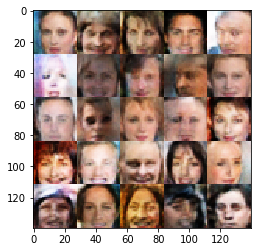

Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 0.4763
Epoch 1/1... Discriminator Loss: 1.0611... Generator Loss: 0.7866
Epoch 1/1... Discriminator Loss: 0.9180... Generator Loss: 1.0379
Epoch 1/1... Discriminator Loss: 0.9669... Generator Loss: 1.1949
Epoch 1/1... Discriminator Loss: 1.0691... Generator Loss: 1.0620
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.5107
Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 1.0412
Epoch 1/1... Discriminator Loss: 1.1223... Generator Loss: 0.6673
Epoch 1/1... Discriminator Loss: 0.8955... Generator Loss: 1.2133
Epoch 1/1... Discriminator Loss: 1.1831... Generator Loss: 1.0096


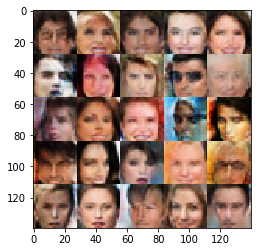

Epoch 1/1... Discriminator Loss: 1.1571... Generator Loss: 0.8431
Epoch 1/1... Discriminator Loss: 1.1924... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.2207... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 1.3805
Epoch 1/1... Discriminator Loss: 1.8620... Generator Loss: 0.2606
Epoch 1/1... Discriminator Loss: 0.9080... Generator Loss: 1.0170
Epoch 1/1... Discriminator Loss: 0.9750... Generator Loss: 0.8544
Epoch 1/1... Discriminator Loss: 0.8236... Generator Loss: 1.3975
Epoch 1/1... Discriminator Loss: 1.2421... Generator Loss: 0.7514
Epoch 1/1... Discriminator Loss: 1.8214... Generator Loss: 0.2775


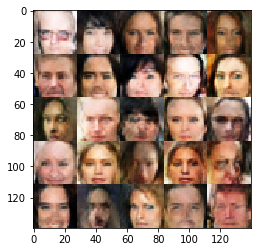

Epoch 1/1... Discriminator Loss: 1.1882... Generator Loss: 0.6003
Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 0.9466
Epoch 1/1... Discriminator Loss: 1.5691... Generator Loss: 0.3717
Epoch 1/1... Discriminator Loss: 1.0123... Generator Loss: 1.4755
Epoch 1/1... Discriminator Loss: 1.3330... Generator Loss: 0.5403
Epoch 1/1... Discriminator Loss: 1.2004... Generator Loss: 0.5797
Epoch 1/1... Discriminator Loss: 1.4878... Generator Loss: 0.4066
Epoch 1/1... Discriminator Loss: 0.8907... Generator Loss: 1.4070
Epoch 1/1... Discriminator Loss: 0.9072... Generator Loss: 1.3566
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.5361


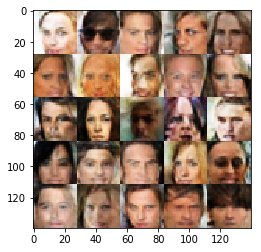

Epoch 1/1... Discriminator Loss: 0.9813... Generator Loss: 0.9314
Epoch 1/1... Discriminator Loss: 0.9013... Generator Loss: 1.0966
Epoch 1/1... Discriminator Loss: 1.0053... Generator Loss: 0.8339
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.4262
Epoch 1/1... Discriminator Loss: 1.6189... Generator Loss: 0.3584
Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.6173
Epoch 1/1... Discriminator Loss: 0.8642... Generator Loss: 1.2316
Epoch 1/1... Discriminator Loss: 0.7750... Generator Loss: 1.2304
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.4302
Epoch 1/1... Discriminator Loss: 1.0730... Generator Loss: 0.8957


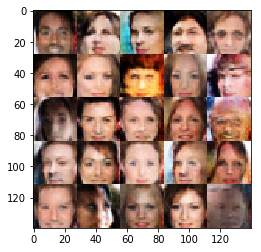

Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 0.5365
Epoch 1/1... Discriminator Loss: 1.0555... Generator Loss: 0.8563
Epoch 1/1... Discriminator Loss: 0.6579... Generator Loss: 1.5265
Epoch 1/1... Discriminator Loss: 1.0236... Generator Loss: 0.8012
Epoch 1/1... Discriminator Loss: 1.6921... Generator Loss: 0.3395
Epoch 1/1... Discriminator Loss: 1.3926... Generator Loss: 0.4685
Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 1.1479... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 0.8910... Generator Loss: 1.0846
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.8268


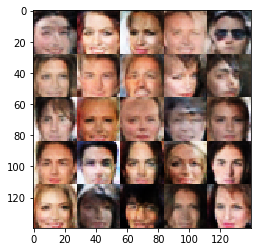

Epoch 1/1... Discriminator Loss: 1.0357... Generator Loss: 0.9325
Epoch 1/1... Discriminator Loss: 1.5271... Generator Loss: 0.4064
Epoch 1/1... Discriminator Loss: 0.8773... Generator Loss: 1.4108
Epoch 1/1... Discriminator Loss: 1.0065... Generator Loss: 0.9435
Epoch 1/1... Discriminator Loss: 0.8712... Generator Loss: 1.0884
Epoch 1/1... Discriminator Loss: 0.9086... Generator Loss: 1.2987
Epoch 1/1... Discriminator Loss: 0.9782... Generator Loss: 1.0473
Epoch 1/1... Discriminator Loss: 0.8430... Generator Loss: 1.2168
Epoch 1/1... Discriminator Loss: 1.1636... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.2087... Generator Loss: 0.6405


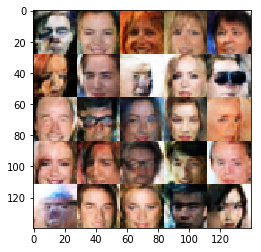

Epoch 1/1... Discriminator Loss: 1.0705... Generator Loss: 1.1541
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 0.8634
Epoch 1/1... Discriminator Loss: 0.8449... Generator Loss: 1.3010
Epoch 1/1... Discriminator Loss: 1.0968... Generator Loss: 1.1221
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.5430
Epoch 1/1... Discriminator Loss: 1.0180... Generator Loss: 1.0755
Epoch 1/1... Discriminator Loss: 0.8444... Generator Loss: 0.9895
Epoch 1/1... Discriminator Loss: 1.0936... Generator Loss: 0.7307
Epoch 1/1... Discriminator Loss: 0.9989... Generator Loss: 1.0059
Epoch 1/1... Discriminator Loss: 1.1856... Generator Loss: 0.7844


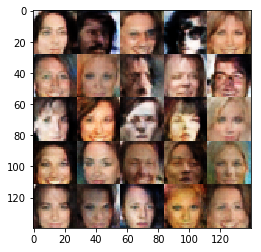

Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.5463
Epoch 1/1... Discriminator Loss: 1.2384... Generator Loss: 0.5645
Epoch 1/1... Discriminator Loss: 1.6328... Generator Loss: 0.3552
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.8269
Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 0.5057
Epoch 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.8841
Epoch 1/1... Discriminator Loss: 1.0493... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.5873... Generator Loss: 0.3621
Epoch 1/1... Discriminator Loss: 1.1595... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.4734


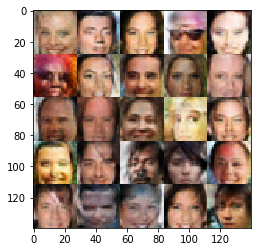

Epoch 1/1... Discriminator Loss: 1.6066... Generator Loss: 0.3607
Epoch 1/1... Discriminator Loss: 0.9579... Generator Loss: 1.0171
Epoch 1/1... Discriminator Loss: 1.0558... Generator Loss: 0.9937
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.5069
Epoch 1/1... Discriminator Loss: 1.5747... Generator Loss: 0.3972
Epoch 1/1... Discriminator Loss: 1.1815... Generator Loss: 0.6512
Epoch 1/1... Discriminator Loss: 0.9655... Generator Loss: 1.1039
Epoch 1/1... Discriminator Loss: 0.9721... Generator Loss: 1.6638
Epoch 1/1... Discriminator Loss: 1.3150... Generator Loss: 0.5555
Epoch 1/1... Discriminator Loss: 1.1922... Generator Loss: 0.6991


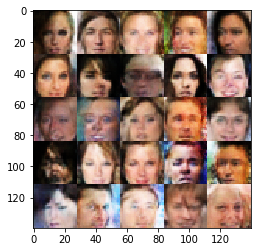

Epoch 1/1... Discriminator Loss: 1.1029... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 1.2161... Generator Loss: 0.7585
Epoch 1/1... Discriminator Loss: 1.1056... Generator Loss: 0.8469
Epoch 1/1... Discriminator Loss: 1.6439... Generator Loss: 0.3330
Epoch 1/1... Discriminator Loss: 0.9110... Generator Loss: 1.1581
Epoch 1/1... Discriminator Loss: 1.0706... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.4689
Epoch 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.4914
Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.6014
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.6563


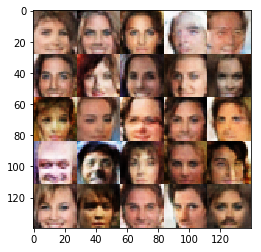

Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 1.0744
Epoch 1/1... Discriminator Loss: 1.4815... Generator Loss: 0.4427
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.4906
Epoch 1/1... Discriminator Loss: 1.1399... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.4761... Generator Loss: 0.4214
Epoch 1/1... Discriminator Loss: 0.7832... Generator Loss: 1.2046
Epoch 1/1... Discriminator Loss: 1.2597... Generator Loss: 0.5682
Epoch 1/1... Discriminator Loss: 0.9233... Generator Loss: 0.9961
Epoch 1/1... Discriminator Loss: 0.9852... Generator Loss: 1.1725
Epoch 1/1... Discriminator Loss: 1.0214... Generator Loss: 0.8838


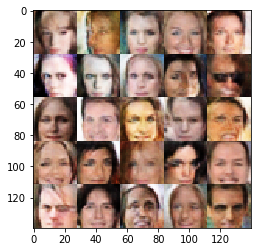

Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.5049
Epoch 1/1... Discriminator Loss: 1.1198... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.3521... Generator Loss: 0.5423
Epoch 1/1... Discriminator Loss: 1.0837... Generator Loss: 0.9198
Epoch 1/1... Discriminator Loss: 1.1956... Generator Loss: 0.6212
Epoch 1/1... Discriminator Loss: 0.9542... Generator Loss: 0.9361
Epoch 1/1... Discriminator Loss: 0.9250... Generator Loss: 1.2026
Epoch 1/1... Discriminator Loss: 1.1878... Generator Loss: 0.5949
Epoch 1/1... Discriminator Loss: 1.8687... Generator Loss: 0.3083
Epoch 1/1... Discriminator Loss: 1.7272... Generator Loss: 0.3469


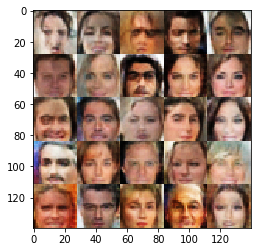

Epoch 1/1... Discriminator Loss: 1.5743... Generator Loss: 0.3955
Epoch 1/1... Discriminator Loss: 1.4535... Generator Loss: 0.4331
Epoch 1/1... Discriminator Loss: 1.0212... Generator Loss: 2.2797
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 0.5830
Epoch 1/1... Discriminator Loss: 1.2492... Generator Loss: 1.1753
Epoch 1/1... Discriminator Loss: 1.0091... Generator Loss: 1.0223
Epoch 1/1... Discriminator Loss: 1.0275... Generator Loss: 0.8999
Epoch 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 0.6996... Generator Loss: 1.8478
Epoch 1/1... Discriminator Loss: 1.6381... Generator Loss: 0.3581


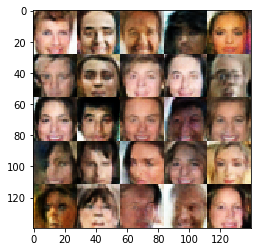

Epoch 1/1... Discriminator Loss: 1.0430... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 0.8921... Generator Loss: 0.9852
Epoch 1/1... Discriminator Loss: 1.0466... Generator Loss: 1.2057
Epoch 1/1... Discriminator Loss: 1.0113... Generator Loss: 0.9308
Epoch 1/1... Discriminator Loss: 1.3527... Generator Loss: 0.4917
Epoch 1/1... Discriminator Loss: 1.4893... Generator Loss: 0.4174


In [41]:
batch_size = 16
z_dim = 128
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.